In [1]:
import pandas as pd
import datetime
import json
#import pandas_datareader as pdr
import numpy as np
import matplotlib.pyplot as plt
from keras import models
from keras import layers
from keras import optimizers
from matplotlib.image import imread
from keras.preprocessing import image
from sklearn.metrics import r2_score
import seaborn as sns

Using TensorFlow backend.


### Pulling stock list from Virtus LifeSci Biotech ETF

In [2]:
stocks = ['ITCI', 'AXSM', 'CVM', 'KRTX', 'APLS', 'PRVB', 'CRTX', 'EPZM',
       'CRBP', 'CCXI', 'TGTX', 'IMGN', 'FATE', 'AKBA', 'DNLI', 'RIGL',
       'PRNB', 'ARVN', 'ZYME', 'MRNA', 'CYTK', 'FTSV', 'ASND',
       'XBIT', 'ALEC', 'ORTX', 'ADVM', 'MGNX', 'AKRO', 'ESPR', 'BHVN',
       'YMAB', 'RGNX', 'MYOK', 'TPTX', 'ATNX', 'BLUE', 'AGEN', 'AVRO',
       'DCPH', 'CTMX', 'SRNE', 'ARDX', 'BCRX', 'RETA', 'KOD', 'DTIL',
       'RARX', 'AUTL', 'GTHX', 'CARA', 'KDMN', 'XNCR', 'ACHN', 'ARNA',
       'RCKT', 'TBIO', 'VYGR', 'SGMO', 'ODT', 'ANAB', 'ATRA', 'CNST',
       'GERN', 'BPMC', 'ALLO', 'BBIO', 'FGEN', 'PGNX', 'MGTX', 'NXTC',
       'IMMU', 'ZIOP', 'CRSP', 'IOVA', 'VKTX', 'EIDX', 'MYOV', 'AMRS',
       'KRYS', 'KURA', 'MDGL', 'UBX', 'TCDA', 'QURE', 'MRTX', 'ASMB',
       'GLYC', 'RYTM', 'FIXX', 'DRNA', 'ARWR', 'ALLK', 'GOSS', 'WVE']

In [3]:
with open('1_31_2020_pull.json', 'r') as file:
    data = json.load(file)

In [4]:
start = datetime.datetime.now()
period = [1, 2]
for stock in stocks:
    
    stock_dict_list = data[stock]
    num_days = len(stock_dict_list)
    for index, dict_ in enumerate(stock_dict_list):
        _open = dict_['Open']
        if index+period[1] >= num_days:
            _low = None
            _max = None
        else:
            _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
            _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
        stock_dict_list[index]['Low_1'] = _low
        stock_dict_list[index]['Max_1'] = _max
        
        #Moving Average 10
        if index- 10 >=0:
            average = np.mean([dict_['Open'] for dict_ in stock_dict_list[index-10:index]])
        else:
            average = None
        stock_dict_list[index]['Moving10'] = average
        
        #Moving Average 30
        if index- 30 >=0:
            average = np.mean([dict_['Open'] for dict_ in stock_dict_list[index-30:index]])
        else:
            average = None
        stock_dict_list[index]['Moving30'] = average
        
    data[stock] = stock_dict_list

# # 3 Day Max/Min Value (% Difference from Closing Price)
# # The range is from the 2nd day to the 3rd after the input day
# start = datetime.datetime.now()
# period = [2, 4]
# for stock in stocks:
    
#     stock_dict_list = data[stock]
#     num_days = len(stock_dict_list)
#     for index, dict_ in enumerate(stock_dict_list):
#         _open = dict_['Open']
#         if index+period[1] >= num_days:
#             _low = None
#             _max = None
#         else:
#             _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#             _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#         stock_dict_list[index]['Low_3'] = _low
#         stock_dict_list[index]['Max_3'] = _max
#     data[stock] = stock_dict_list

# # 10 Day Max/Min Value (% Difference from Closing Price)
# # The range is from the 4th day to the 10th after the input day

# start = datetime.datetime.now()
# period = [4, 11]
# for stock in stocks:
    
#     stock_dict_list = data[stock]
#     num_days = len(stock_dict_list)
#     for index, dict_ in enumerate(stock_dict_list):
#         _open = dict_['Open']
#         if index+period[1] >= num_days:
#             _low = None
#             _max = None
#         else:
#             _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#             _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#         stock_dict_list[index]['Low_10'] = _low
#         stock_dict_list[index]['Max_10'] = _max
#     data[stock] = stock_dict_list

# # 30 Day Max/Min Value (% Difference from Closing Price)
# # The range is from the 11th day to the 30th after the input day
# start = datetime.datetime.now()
# period = [11, 31]
# for stock in stocks:
    
#     stock_dict_list = data[stock]
#     num_days = len(stock_dict_list)
#     for index, dict_ in enumerate(stock_dict_list):
#         _open = dict_['Open']
#         if index+period[1] >= num_days:
#             _low = None
#             _max = None
#         else:
#             _low = np.min([dict_['Low'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#             _max = np.max([dict_['High'] for dict_ in stock_dict_list[index+period[0]:index+period[1]]])/ _open -1
#         stock_dict_list[index]['Low_30'] = _low
#         stock_dict_list[index]['Max_30'] = _max
#     data[stock] = stock_dict_list

In [5]:
for stock in stocks:
    df = pd.DataFrame(data[stock])
    max_value = df[['High', 'Low', 'Open', 'Close', 'Adj Close', 'Moving10', 'Moving30']].max()
    df[['High', 'Low', 'Open', 'Close', 'Adj Close', 'Moving10', 'Moving30']] = df[['High', 'Low', 'Open', 'Close',
                                                                                    'Adj Close', 'Moving10', 'Moving30']]/max_value
    df['Volume'] = df['Volume']/ df['Volume'].max()
    df= df.dropna()
    
    data[stock] = df.to_dict('records')

In [6]:
data_in_list = []
for stock in stocks:
    stock_dict_list = data[stock]
    for index, dict_ in enumerate(stock_dict_list):
        list_ = [0, 0, 0, 0, 0, 0, 0, 0]
        if dict_['Low_1'] <= -0.12:
            list_[0] = 1      
        else:
            if dict_['Low_1'] <= -0.1:
                list_[1] = 1
            else:
                if dict_['Low_1'] <= -0.08:
                    list_[2] = 1
                else:
                    if dict_['Low_1'] <= -0.06:
                        list_[3] = 1
                    else:
                        if dict_['Low_1'] <= -0.04:
                            list_[4] = 1
                        else:
                            if dict_['Low_1'] <= -0.02:
                                list_[5] = 1
                            else:
                                if dict_['Low_1'] < 0:
                                    list_[6] = 1
                                else:
                                    list_[7] = 1
        stock_dict_list[index]['Low_1'] = list_
        dict_['Low_1'] = list_
        data_in_list.append(dict_)
    data[stock] = stock_dict_list
df = pd.DataFrame(data_in_list) 
df.describe()

,Adj Close,Close,High,Low,Max_1,Moving10,Moving30,Open,Volume
count,145249.000000,145249.000000,145249.000000,145249.000000,145249.000000,145249.000000,145249.000000,145249.000000,145249.000000
mean,0.260711,0.260711,0.258983,0.262354,14.628752,0.280289,0.300724,0.259255,0.026125
std,0.233928,0.233928,0.233008,0.234513,241.895040,0.244531,0.256038,0.233414,0.050913
min,0.000002,0.000002,0.000003,0.000002,-0.999847,0.000006,0.000482,0.000003,0.000000
25%,0.071907,0.071907,0.071415,0.073402,0.000000,0.082165,0.091947,0.071223,0.002690
50%,0.186074,0.186074,0.183905,0.187259,0.021452,0.203135,0.222163,0.183868,0.011252
75%,0.387178,0.387178,0.384500,0.387692,0.054745,0.414505,0.448409,0.384056,0.031204
max,1.000000,1.000000,1.000000,1.000000,6817.181855,1.000000,1.000000,1.000000,1.000000


In [7]:
list_

[0, 0, 0, 0, 0, 1, 0, 0]

In [8]:
processed_data = {}

for stock in stocks:
    x = []
    target = []
    dict_ = {}
    for i in data[stock]:
        row =np.array([i['High'], i['Low'], i['Open'], i['Close'], i['Adj Close'], i['Volume'], i['Moving10'], i['Moving30']])
        x.append(row)
        row = np.array(i['Low_1'])
        target.append(row)
    dict_['Data'] = x
    dict_['Target'] = target
    processed_data[stock] = dict_

In [9]:
for stock in stocks:
    length_ = len(processed_data[stock]['Data'])
    length_test = len(processed_data[stock]['Data'])//8
    test_start = length_- 50
    test_end = length_test+ test_start
    processed_data[stock]['data_1'] = np.array(processed_data[stock]['Data'][:test_start])
    processed_data[stock]['data_1'] =   processed_data[stock]['data_1'].reshape(len(processed_data[stock]['data_1']), 1, 8)
    processed_data[stock]['data_test'] = np.array(processed_data[stock]['Data'][test_start:-10])
    processed_data[stock]['data_test'] = processed_data[stock]['data_test'].reshape(len(processed_data[stock]['data_test']),1,8)
    transfer_list = np.array(processed_data[stock]['Target'][:test_start])
    processed_data[stock]['target_1'] =transfer_list.reshape(len(transfer_list), 8)
    transfer_list = np.array(processed_data[stock]['Target'][test_start:-10])
    processed_data[stock]['target_test'] = transfer_list.reshape(len(transfer_list),8)

In [10]:
model = models.Sequential()
model.add(layers.GRU(50, return_sequences=True, input_shape=(1,8)))
model.add(layers.Dropout(0.5))
model.add(layers.GRU(100, return_sequences=False))
model.add(layers.Dropout(0.5))

model.add(layers.Dense(8, activation = "softmax"))
model.compile(loss='categorical_crossentropy',
              optimizer='adam', metrics=['accuracy'])

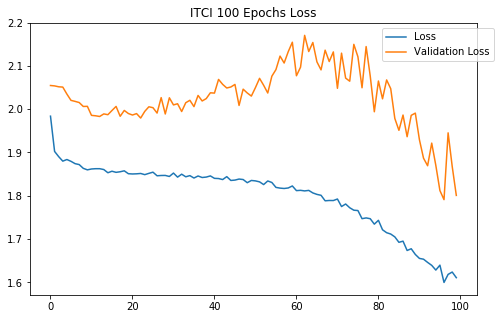

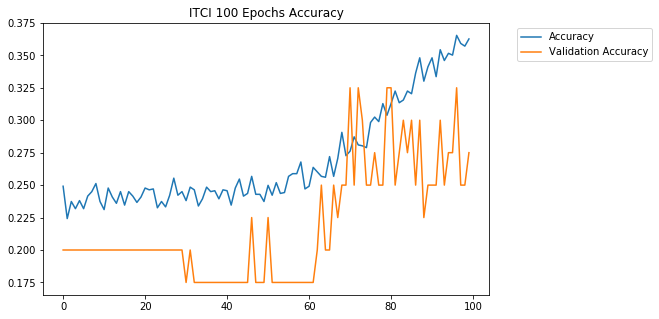

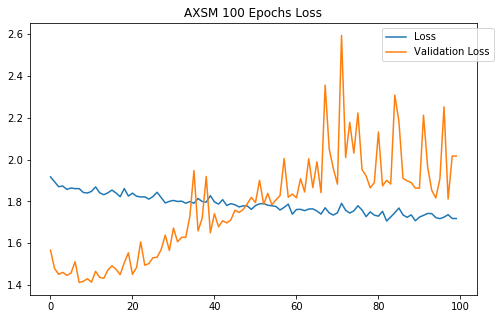

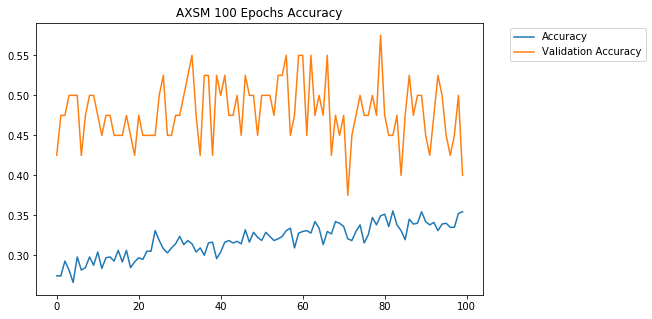

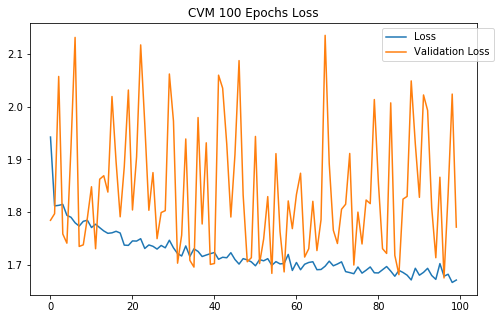

...

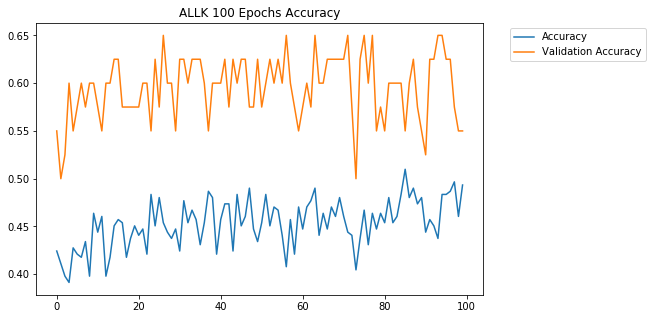

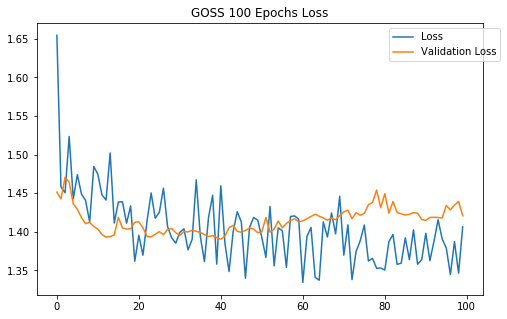

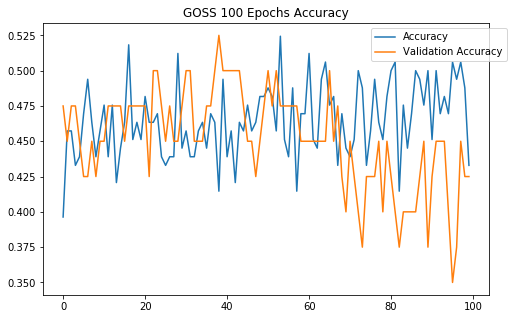

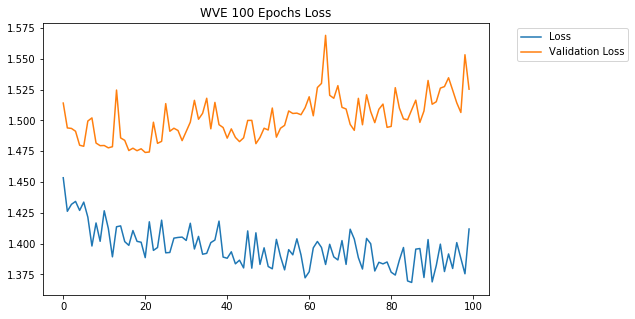

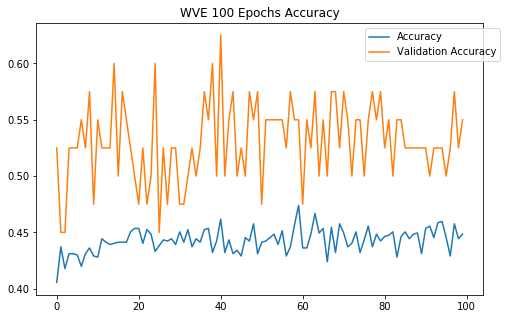

In [11]:
epochs = 100
for stock in stocks:
    (feature_train, label_train, feature_test, label_test) = (processed_data[stock]['data_1'],processed_data[stock]['target_1'], 
                                                                    processed_data[stock]['data_test'],
                                                              processed_data[stock]['target_test']) 
    model.fit(feature_train, label_train, batch_size=25, epochs=epochs, 
              validation_data = (feature_test, label_test), verbose=0)
    dict_ = model.history.history
    plt.figure(figsize=(8,5))
    plt.title(f"{stock} {epochs} Epochs Loss")
    plt.plot(dict_['loss'], label = 'Loss')
    plt.plot(dict_['val_loss'], label= 'Validation Loss')
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.show()
    plt.figure(figsize=(8,5))
    plt.title(f"{stock} {epochs} Epochs Accuracy")
    plt.plot(dict_['acc'], label = 'Accuracy')
    plt.plot(dict_['val_acc'], label= 'Validation Accuracy')
    plt.legend(bbox_to_anchor=(1.05, 1))
    plt.show() 

Train on 4903 samples, validate on 40 samples
Epoch 1/5000
4903/4903 [==============================] - 1s 177us/step - loss: 1.5248 - acc: 0.4044 - val_loss: 1.2996 - val_acc: 0.5000
Epoch 2/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.5019 - acc: 0.4242 - val_loss: 1.2827 - val_acc: 0.5250
Epoch 3/5000
4903/4903 [==============================] - 1s 164us/step - loss: 1.4949 - acc: 0.4248 - val_loss: 1.2634 - val_acc: 0.5250
Epoch 4/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4955 - acc: 0.4167 - val_loss: 1.2811 - val_acc: 0.5250
Epoch 5/5000
4903/4903 [==============================] - 1s 170us/step - loss: 1.4860 - acc: 0.4287 - val_loss: 1.3040 - val_acc: 0.5000
Epoch 6/5000
4903/4903 [==============================] - 1s 171us/step - loss: 1.4801 - acc: 0.4297 - val_loss: 1.2979 - val_acc: 0.4750
Epoch 7/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4923 - acc: 0.4267 - val_loss: 1.2645 - val_

4903/4903 [==============================] - 1s 172us/step - loss: 1.4563 - acc: 0.4365 - val_loss: 1.3120 - val_acc: 0.5500
Epoch 60/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4564 - acc: 0.4367 - val_loss: 1.2701 - val_acc: 0.5500
Epoch 61/5000
4903/4903 [==============================] - 1s 177us/step - loss: 1.4569 - acc: 0.4348 - val_loss: 1.2482 - val_acc: 0.5500
Epoch 62/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4577 - acc: 0.4397 - val_loss: 1.2966 - val_acc: 0.5250
Epoch 63/5000
4903/4903 [==============================] - 1s 165us/step - loss: 1.4637 - acc: 0.4314 - val_loss: 1.3244 - val_acc: 0.5750
Epoch 64/5000
4903/4903 [==============================] - 1s 164us/step - loss: 1.4609 - acc: 0.4346 - val_loss: 1.2742 - val_acc: 0.5750
Epoch 65/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4535 - acc: 0.4397 - val_loss: 1.2774 - val_acc: 0.5500
Epoch 66/5000
4903/4903 [================

Epoch 118/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4579 - acc: 0.4352 - val_loss: 1.2905 - val_acc: 0.5500
Epoch 119/5000
4903/4903 [==============================] - 1s 154us/step - loss: 1.4499 - acc: 0.4379 - val_loss: 1.2709 - val_acc: 0.5500
Epoch 120/5000
4903/4903 [==============================] - 1s 153us/step - loss: 1.4521 - acc: 0.4414 - val_loss: 1.2821 - val_acc: 0.5500
Epoch 121/5000
4903/4903 [==============================] - 1s 155us/step - loss: 1.4541 - acc: 0.4432 - val_loss: 1.2660 - val_acc: 0.5750
Epoch 122/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4535 - acc: 0.4344 - val_loss: 1.2516 - val_acc: 0.5250
Epoch 123/5000
4903/4903 [==============================] - 1s 155us/step - loss: 1.4536 - acc: 0.4344 - val_loss: 1.2434 - val_acc: 0.5250
Epoch 124/5000
4903/4903 [==============================] - 1s 172us/step - loss: 1.4585 - acc: 0.4348 - val_loss: 1.2591 - val_acc: 0.5000
Epoch 125/5000
4903/

4903/4903 [==============================] - 1s 154us/step - loss: 1.4505 - acc: 0.4363 - val_loss: 1.2458 - val_acc: 0.5250
Epoch 177/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4523 - acc: 0.4408 - val_loss: 1.3621 - val_acc: 0.5500
Epoch 178/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4482 - acc: 0.4448 - val_loss: 1.2825 - val_acc: 0.6000
Epoch 179/5000
4903/4903 [==============================] - 1s 154us/step - loss: 1.4565 - acc: 0.4334 - val_loss: 1.2426 - val_acc: 0.5500
Epoch 180/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4507 - acc: 0.4367 - val_loss: 1.2591 - val_acc: 0.5750
Epoch 181/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4415 - acc: 0.4342 - val_loss: 1.2571 - val_acc: 0.5500
Epoch 182/5000
4903/4903 [==============================] - 1s 172us/step - loss: 1.4547 - acc: 0.4438 - val_loss: 1.3432 - val_acc: 0.5500
Epoch 183/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 161us/step - loss: 1.4431 - acc: 0.4456 - val_loss: 1.2544 - val_acc: 0.5250
Epoch 235/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4479 - acc: 0.4383 - val_loss: 1.2690 - val_acc: 0.5750
Epoch 236/5000
4903/4903 [==============================] - 1s 152us/step - loss: 1.4535 - acc: 0.4365 - val_loss: 1.2458 - val_acc: 0.5750
Epoch 237/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4545 - acc: 0.4430 - val_loss: 1.2655 - val_acc: 0.5750
Epoch 238/5000
4903/4903 [==============================] - 1s 164us/step - loss: 1.4443 - acc: 0.4438 - val_loss: 1.3142 - val_acc: 0.5500
Epoch 239/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4480 - acc: 0.4328 - val_loss: 1.2962 - val_acc: 0.5250
Epoch 240/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4514 - acc: 0.4424 - val_loss: 1.2528 - val_acc: 0.5500
Epoch 241/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 156us/step - loss: 1.4469 - acc: 0.4403 - val_loss: 1.2583 - val_acc: 0.5500
Epoch 293/5000
4903/4903 [==============================] - 1s 177us/step - loss: 1.4432 - acc: 0.4479 - val_loss: 1.2546 - val_acc: 0.5750
Epoch 294/5000
4903/4903 [==============================] - 1s 179us/step - loss: 1.4409 - acc: 0.4507 - val_loss: 1.2670 - val_acc: 0.5500
Epoch 295/5000
4903/4903 [==============================] - 1s 188us/step - loss: 1.4484 - acc: 0.4405 - val_loss: 1.2620 - val_acc: 0.5500
Epoch 296/5000
4903/4903 [==============================] - 1s 173us/step - loss: 1.4513 - acc: 0.4387 - val_loss: 1.2713 - val_acc: 0.6000
Epoch 297/5000
4903/4903 [==============================] - 1s 168us/step - loss: 1.4593 - acc: 0.4340 - val_loss: 1.2546 - val_acc: 0.5250
Epoch 298/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4492 - acc: 0.4379 - val_loss: 1.2535 - val_acc: 0.5000
Epoch 299/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 154us/step - loss: 1.4337 - acc: 0.4434 - val_loss: 1.2528 - val_acc: 0.5500
Epoch 351/5000
4903/4903 [==============================] - 1s 153us/step - loss: 1.4469 - acc: 0.4377 - val_loss: 1.2512 - val_acc: 0.5750
Epoch 352/5000
4903/4903 [==============================] - 1s 152us/step - loss: 1.4492 - acc: 0.4389 - val_loss: 1.2713 - val_acc: 0.5500
Epoch 353/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4376 - acc: 0.4477 - val_loss: 1.3105 - val_acc: 0.5750
Epoch 354/5000
4903/4903 [==============================] - 1s 155us/step - loss: 1.4560 - acc: 0.4426 - val_loss: 1.2387 - val_acc: 0.5000
Epoch 355/5000
4903/4903 [==============================] - 1s 152us/step - loss: 1.4424 - acc: 0.4375 - val_loss: 1.2766 - val_acc: 0.5750
Epoch 356/5000
4903/4903 [==============================] - 1s 155us/step - loss: 1.4472 - acc: 0.4418 - val_loss: 1.2411 - val_acc: 0.6000
Epoch 357/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 159us/step - loss: 1.4469 - acc: 0.4365 - val_loss: 1.2361 - val_acc: 0.4750
Epoch 409/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4437 - acc: 0.4414 - val_loss: 1.2347 - val_acc: 0.5750
Epoch 410/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4522 - acc: 0.4369 - val_loss: 1.2404 - val_acc: 0.5500
Epoch 411/5000
4903/4903 [==============================] - 1s 175us/step - loss: 1.4454 - acc: 0.4393 - val_loss: 1.3095 - val_acc: 0.5750
Epoch 412/5000
4903/4903 [==============================] - 1s 168us/step - loss: 1.4491 - acc: 0.4348 - val_loss: 1.2537 - val_acc: 0.5500
Epoch 413/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4465 - acc: 0.4418 - val_loss: 1.2866 - val_acc: 0.5500
Epoch 414/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4479 - acc: 0.4467 - val_loss: 1.2447 - val_acc: 0.5250
Epoch 415/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 179us/step - loss: 1.4433 - acc: 0.4420 - val_loss: 1.2457 - val_acc: 0.5500
Epoch 467/5000
4903/4903 [==============================] - 1s 177us/step - loss: 1.4455 - acc: 0.4422 - val_loss: 1.2670 - val_acc: 0.5250
Epoch 468/5000
4903/4903 [==============================] - 1s 192us/step - loss: 1.4429 - acc: 0.4412 - val_loss: 1.2687 - val_acc: 0.6000
Epoch 469/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4429 - acc: 0.4422 - val_loss: 1.2962 - val_acc: 0.5500
Epoch 470/5000
4903/4903 [==============================] - 1s 191us/step - loss: 1.4475 - acc: 0.4365 - val_loss: 1.2499 - val_acc: 0.5500
Epoch 471/5000
4903/4903 [==============================] - 1s 164us/step - loss: 1.4374 - acc: 0.4369 - val_loss: 1.2825 - val_acc: 0.5750
Epoch 472/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4498 - acc: 0.4389 - val_loss: 1.2736 - val_acc: 0.5500
Epoch 473/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 166us/step - loss: 1.4434 - acc: 0.4434 - val_loss: 1.2655 - val_acc: 0.5500
Epoch 525/5000
4903/4903 [==============================] - 1s 201us/step - loss: 1.4325 - acc: 0.4495 - val_loss: 1.3006 - val_acc: 0.5750
Epoch 526/5000
4903/4903 [==============================] - 1s 206us/step - loss: 1.4373 - acc: 0.4381 - val_loss: 1.2670 - val_acc: 0.5500
Epoch 527/5000
4903/4903 [==============================] - 1s 198us/step - loss: 1.4376 - acc: 0.4403 - val_loss: 1.2550 - val_acc: 0.5500
Epoch 528/5000
4903/4903 [==============================] - 1s 200us/step - loss: 1.4306 - acc: 0.4450 - val_loss: 1.3000 - val_acc: 0.5500
Epoch 529/5000
4903/4903 [==============================] - 1s 185us/step - loss: 1.4422 - acc: 0.4379 - val_loss: 1.2937 - val_acc: 0.5500
Epoch 530/5000
4903/4903 [==============================] - 1s 180us/step - loss: 1.4363 - acc: 0.4428 - val_loss: 1.2654 - val_acc: 0.5500
Epoch 531/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 170us/step - loss: 1.4337 - acc: 0.4446 - val_loss: 1.2961 - val_acc: 0.5750
Epoch 583/5000
4903/4903 [==============================] - 1s 170us/step - loss: 1.4318 - acc: 0.4489 - val_loss: 1.2373 - val_acc: 0.5250
Epoch 584/5000
4903/4903 [==============================] - 1s 170us/step - loss: 1.4412 - acc: 0.4414 - val_loss: 1.2535 - val_acc: 0.5250
Epoch 585/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4354 - acc: 0.4408 - val_loss: 1.2703 - val_acc: 0.5750
Epoch 586/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4455 - acc: 0.4377 - val_loss: 1.2420 - val_acc: 0.5250
Epoch 587/5000
4903/4903 [==============================] - 1s 173us/step - loss: 1.4439 - acc: 0.4434 - val_loss: 1.2797 - val_acc: 0.6000
Epoch 588/5000
4903/4903 [==============================] - 1s 173us/step - loss: 1.4386 - acc: 0.4440 - val_loss: 1.2375 - val_acc: 0.5250
Epoch 589/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 182us/step - loss: 1.4458 - acc: 0.4450 - val_loss: 1.2600 - val_acc: 0.5500
Epoch 641/5000
4903/4903 [==============================] - 1s 182us/step - loss: 1.4414 - acc: 0.4369 - val_loss: 1.2749 - val_acc: 0.5500
Epoch 642/5000
4903/4903 [==============================] - 1s 189us/step - loss: 1.4356 - acc: 0.4416 - val_loss: 1.2789 - val_acc: 0.5500
Epoch 643/5000
4903/4903 [==============================] - 1s 198us/step - loss: 1.4374 - acc: 0.4465 - val_loss: 1.2834 - val_acc: 0.5500
Epoch 644/5000
4903/4903 [==============================] - 1s 190us/step - loss: 1.4349 - acc: 0.4418 - val_loss: 1.2621 - val_acc: 0.5750
Epoch 645/5000
4903/4903 [==============================] - 1s 189us/step - loss: 1.4373 - acc: 0.4418 - val_loss: 1.2667 - val_acc: 0.5750
Epoch 646/5000
4903/4903 [==============================] - 1s 185us/step - loss: 1.4373 - acc: 0.4434 - val_loss: 1.2831 - val_acc: 0.5750
Epoch 647/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 172us/step - loss: 1.4325 - acc: 0.4434 - val_loss: 1.2597 - val_acc: 0.5250
Epoch 699/5000
4903/4903 [==============================] - 1s 185us/step - loss: 1.4314 - acc: 0.4483 - val_loss: 1.2494 - val_acc: 0.5250
Epoch 700/5000
4903/4903 [==============================] - 1s 175us/step - loss: 1.4447 - acc: 0.4393 - val_loss: 1.2959 - val_acc: 0.5500
Epoch 701/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4451 - acc: 0.4430 - val_loss: 1.2845 - val_acc: 0.5500
Epoch 702/5000
4903/4903 [==============================] - 1s 154us/step - loss: 1.4408 - acc: 0.4344 - val_loss: 1.2705 - val_acc: 0.5500
Epoch 703/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4337 - acc: 0.4414 - val_loss: 1.2772 - val_acc: 0.5500
Epoch 704/5000
4903/4903 [==============================] - 1s 169us/step - loss: 1.4406 - acc: 0.4436 - val_loss: 1.2753 - val_acc: 0.5500
Epoch 705/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 184us/step - loss: 1.4328 - acc: 0.4471 - val_loss: 1.3399 - val_acc: 0.5250
Epoch 757/5000
4903/4903 [==============================] - 1s 187us/step - loss: 1.4322 - acc: 0.4446 - val_loss: 1.2929 - val_acc: 0.5500
Epoch 758/5000
4903/4903 [==============================] - 1s 185us/step - loss: 1.4434 - acc: 0.4363 - val_loss: 1.2372 - val_acc: 0.5500
Epoch 759/5000
4903/4903 [==============================] - 1s 184us/step - loss: 1.4422 - acc: 0.4373 - val_loss: 1.2422 - val_acc: 0.5250
Epoch 760/5000
4903/4903 [==============================] - 1s 184us/step - loss: 1.4480 - acc: 0.4420 - val_loss: 1.3285 - val_acc: 0.5500
Epoch 761/5000
4903/4903 [==============================] - 1s 185us/step - loss: 1.4373 - acc: 0.4422 - val_loss: 1.2835 - val_acc: 0.5750
Epoch 762/5000
4903/4903 [==============================] - 1s 193us/step - loss: 1.4320 - acc: 0.4412 - val_loss: 1.2607 - val_acc: 0.5750
Epoch 763/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 172us/step - loss: 1.4391 - acc: 0.4463 - val_loss: 1.2989 - val_acc: 0.5750
Epoch 815/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4391 - acc: 0.4452 - val_loss: 1.2439 - val_acc: 0.5750
Epoch 816/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4337 - acc: 0.4426 - val_loss: 1.2935 - val_acc: 0.5500
Epoch 817/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4340 - acc: 0.4365 - val_loss: 1.2447 - val_acc: 0.5000
Epoch 818/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4425 - acc: 0.4444 - val_loss: 1.2844 - val_acc: 0.6000
Epoch 819/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4424 - acc: 0.4405 - val_loss: 1.2429 - val_acc: 0.5000
Epoch 820/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4355 - acc: 0.4452 - val_loss: 1.2319 - val_acc: 0.5250
Epoch 821/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 171us/step - loss: 1.4389 - acc: 0.4381 - val_loss: 1.2393 - val_acc: 0.5750
Epoch 873/5000
4903/4903 [==============================] - 1s 171us/step - loss: 1.4351 - acc: 0.4393 - val_loss: 1.2673 - val_acc: 0.5750
Epoch 874/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4366 - acc: 0.4450 - val_loss: 1.2568 - val_acc: 0.5500
Epoch 875/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4409 - acc: 0.4426 - val_loss: 1.4029 - val_acc: 0.4250
Epoch 876/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4355 - acc: 0.4416 - val_loss: 1.2396 - val_acc: 0.5500
Epoch 877/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4352 - acc: 0.4434 - val_loss: 1.2777 - val_acc: 0.6000
Epoch 878/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4338 - acc: 0.4420 - val_loss: 1.2659 - val_acc: 0.5750
Epoch 879/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 167us/step - loss: 1.4335 - acc: 0.4526 - val_loss: 1.3172 - val_acc: 0.5750
Epoch 931/5000
4903/4903 [==============================] - 1s 168us/step - loss: 1.4373 - acc: 0.4448 - val_loss: 1.3372 - val_acc: 0.5750
Epoch 932/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4331 - acc: 0.4422 - val_loss: 1.2644 - val_acc: 0.5750
Epoch 933/5000
4903/4903 [==============================] - 1s 165us/step - loss: 1.4271 - acc: 0.4505 - val_loss: 1.2408 - val_acc: 0.5250
Epoch 934/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4380 - acc: 0.4495 - val_loss: 1.3420 - val_acc: 0.5500
Epoch 935/5000
4903/4903 [==============================] - 1s 178us/step - loss: 1.4318 - acc: 0.4471 - val_loss: 1.2459 - val_acc: 0.5250
Epoch 936/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4360 - acc: 0.4401 - val_loss: 1.2408 - val_acc: 0.5250
Epoch 937/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 175us/step - loss: 1.4334 - acc: 0.4530 - val_loss: 1.2701 - val_acc: 0.5500
Epoch 989/5000
4903/4903 [==============================] - 1s 184us/step - loss: 1.4349 - acc: 0.4469 - val_loss: 1.3059 - val_acc: 0.5750
Epoch 990/5000
4903/4903 [==============================] - 1s 172us/step - loss: 1.4337 - acc: 0.4426 - val_loss: 1.2566 - val_acc: 0.5500
Epoch 991/5000
4903/4903 [==============================] - 1s 173us/step - loss: 1.4384 - acc: 0.4465 - val_loss: 1.2600 - val_acc: 0.5500
Epoch 992/5000
4903/4903 [==============================] - 1s 171us/step - loss: 1.4256 - acc: 0.4563 - val_loss: 1.2977 - val_acc: 0.5500
Epoch 993/5000
4903/4903 [==============================] - 1s 169us/step - loss: 1.4275 - acc: 0.4493 - val_loss: 1.2685 - val_acc: 0.5500
Epoch 994/5000
4903/4903 [==============================] - 1s 169us/step - loss: 1.4332 - acc: 0.4461 - val_loss: 1.2994 - val_acc: 0.5500
Epoch 995/5000
4903/4903 [=========

4903/4903 [==============================] - 1s 161us/step - loss: 1.4307 - acc: 0.4414 - val_loss: 1.2682 - val_acc: 0.5750
Epoch 1047/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4314 - acc: 0.4383 - val_loss: 1.2927 - val_acc: 0.5250
Epoch 1048/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4343 - acc: 0.4371 - val_loss: 1.2678 - val_acc: 0.5500
Epoch 1049/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4288 - acc: 0.4456 - val_loss: 1.2656 - val_acc: 0.5500
Epoch 1050/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4311 - acc: 0.4412 - val_loss: 1.2851 - val_acc: 0.5500
Epoch 1051/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4350 - acc: 0.4426 - val_loss: 1.2674 - val_acc: 0.5500
Epoch 1052/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4437 - acc: 0.4369 - val_loss: 1.2806 - val_acc: 0.5750
Epoch 1053/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4290 - acc: 0.4438 - val_loss: 1.2593 - val_acc: 0.5500
Epoch 1105/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4307 - acc: 0.4516 - val_loss: 1.2653 - val_acc: 0.5500
Epoch 1106/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4389 - acc: 0.4367 - val_loss: 1.3527 - val_acc: 0.5500
Epoch 1107/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4315 - acc: 0.4434 - val_loss: 1.2447 - val_acc: 0.5500
Epoch 1108/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4366 - acc: 0.4461 - val_loss: 1.2616 - val_acc: 0.5250
Epoch 1109/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4308 - acc: 0.4458 - val_loss: 1.2623 - val_acc: 0.5500
Epoch 1110/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4321 - acc: 0.4375 - val_loss: 1.3259 - val_acc: 0.5750
Epoch 1111/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4327 - acc: 0.4420 - val_loss: 1.2507 - val_acc: 0.5500
Epoch 1163/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4335 - acc: 0.4408 - val_loss: 1.2768 - val_acc: 0.5250
Epoch 1164/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4357 - acc: 0.4367 - val_loss: 1.2681 - val_acc: 0.5500
Epoch 1165/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4429 - acc: 0.4340 - val_loss: 1.2908 - val_acc: 0.5500
Epoch 1166/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4220 - acc: 0.4481 - val_loss: 1.2591 - val_acc: 0.5500
Epoch 1167/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4401 - acc: 0.4399 - val_loss: 1.3548 - val_acc: 0.5750
Epoch 1168/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4266 - acc: 0.4473 - val_loss: 1.2740 - val_acc: 0.5500
Epoch 1169/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4339 - acc: 0.4467 - val_loss: 1.2941 - val_acc: 0.5750
Epoch 1221/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4334 - acc: 0.4393 - val_loss: 1.2437 - val_acc: 0.5500
Epoch 1222/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4360 - acc: 0.4465 - val_loss: 1.2563 - val_acc: 0.5750
Epoch 1223/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4251 - acc: 0.4465 - val_loss: 1.2774 - val_acc: 0.5750
Epoch 1224/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4307 - acc: 0.4354 - val_loss: 1.2588 - val_acc: 0.5500
Epoch 1225/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4332 - acc: 0.4452 - val_loss: 1.2662 - val_acc: 0.5750
Epoch 1226/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4337 - acc: 0.4432 - val_loss: 1.2624 - val_acc: 0.5500
Epoch 1227/5000
4903/4903 [==

4903/4903 [==============================] - 1s 166us/step - loss: 1.4249 - acc: 0.4512 - val_loss: 1.2662 - val_acc: 0.5250
Epoch 1279/5000
4903/4903 [==============================] - 1s 165us/step - loss: 1.4258 - acc: 0.4503 - val_loss: 1.2446 - val_acc: 0.5500
Epoch 1280/5000
4903/4903 [==============================] - 1s 164us/step - loss: 1.4341 - acc: 0.4467 - val_loss: 1.2648 - val_acc: 0.5250
Epoch 1281/5000
4903/4903 [==============================] - 1s 164us/step - loss: 1.4308 - acc: 0.4473 - val_loss: 1.2540 - val_acc: 0.5000
Epoch 1282/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4206 - acc: 0.4524 - val_loss: 1.2682 - val_acc: 0.5500
Epoch 1283/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4304 - acc: 0.4430 - val_loss: 1.2681 - val_acc: 0.5250
Epoch 1284/5000
4903/4903 [==============================] - 1s 171us/step - loss: 1.4317 - acc: 0.4395 - val_loss: 1.2775 - val_acc: 0.5500
Epoch 1285/5000
4903/4903 [==

4903/4903 [==============================] - 1s 160us/step - loss: 1.4188 - acc: 0.4507 - val_loss: 1.4269 - val_acc: 0.4750
Epoch 1337/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4386 - acc: 0.4416 - val_loss: 1.2628 - val_acc: 0.5000
Epoch 1338/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4307 - acc: 0.4581 - val_loss: 1.2414 - val_acc: 0.5000
Epoch 1339/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4273 - acc: 0.4458 - val_loss: 1.2374 - val_acc: 0.5250
Epoch 1340/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4259 - acc: 0.4452 - val_loss: 1.3103 - val_acc: 0.5500
Epoch 1341/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4351 - acc: 0.4414 - val_loss: 1.2666 - val_acc: 0.5250
Epoch 1342/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4294 - acc: 0.4395 - val_loss: 1.3392 - val_acc: 0.5500
Epoch 1343/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4286 - acc: 0.4495 - val_loss: 1.2950 - val_acc: 0.5250
Epoch 1395/5000
4903/4903 [==============================] - 1s 168us/step - loss: 1.4249 - acc: 0.4479 - val_loss: 1.2779 - val_acc: 0.6000
Epoch 1396/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4291 - acc: 0.4509 - val_loss: 1.2690 - val_acc: 0.5500
Epoch 1397/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4345 - acc: 0.4448 - val_loss: 1.2611 - val_acc: 0.5250
Epoch 1398/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4304 - acc: 0.4440 - val_loss: 1.2948 - val_acc: 0.5500
Epoch 1399/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4319 - acc: 0.4507 - val_loss: 1.2801 - val_acc: 0.5500
Epoch 1400/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4329 - acc: 0.4420 - val_loss: 1.2712 - val_acc: 0.5250
Epoch 1401/5000
4903/4903 [==

4903/4903 [==============================] - 1s 160us/step - loss: 1.4255 - acc: 0.4401 - val_loss: 1.3064 - val_acc: 0.5750
Epoch 1453/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4340 - acc: 0.4444 - val_loss: 1.2706 - val_acc: 0.5250
Epoch 1454/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4259 - acc: 0.4487 - val_loss: 1.3451 - val_acc: 0.5250
Epoch 1455/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4343 - acc: 0.4418 - val_loss: 1.2889 - val_acc: 0.5750
Epoch 1456/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4218 - acc: 0.4489 - val_loss: 1.2538 - val_acc: 0.5750
Epoch 1457/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4262 - acc: 0.4520 - val_loss: 1.2814 - val_acc: 0.5500
Epoch 1458/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4257 - acc: 0.4416 - val_loss: 1.2875 - val_acc: 0.5250
Epoch 1459/5000
4903/4903 [==

4903/4903 [==============================] - 1s 162us/step - loss: 1.4278 - acc: 0.4471 - val_loss: 1.2829 - val_acc: 0.5500
Epoch 1511/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4217 - acc: 0.4430 - val_loss: 1.2584 - val_acc: 0.5500
Epoch 1512/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4239 - acc: 0.4473 - val_loss: 1.2490 - val_acc: 0.5250
Epoch 1513/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4387 - acc: 0.4418 - val_loss: 1.3027 - val_acc: 0.5750
Epoch 1514/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4351 - acc: 0.4442 - val_loss: 1.2685 - val_acc: 0.6000
Epoch 1515/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4296 - acc: 0.4440 - val_loss: 1.2618 - val_acc: 0.6000
Epoch 1516/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4293 - acc: 0.4461 - val_loss: 1.2600 - val_acc: 0.5250
Epoch 1517/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4263 - acc: 0.4477 - val_loss: 1.2633 - val_acc: 0.5500
Epoch 1569/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4325 - acc: 0.4385 - val_loss: 1.2820 - val_acc: 0.5750
Epoch 1570/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4365 - acc: 0.4483 - val_loss: 1.2464 - val_acc: 0.5500
Epoch 1571/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4184 - acc: 0.4401 - val_loss: 1.2757 - val_acc: 0.5500
Epoch 1572/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4275 - acc: 0.4507 - val_loss: 1.2510 - val_acc: 0.5500
Epoch 1573/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4343 - acc: 0.4389 - val_loss: 1.2421 - val_acc: 0.5250
Epoch 1574/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4278 - acc: 0.4475 - val_loss: 1.2512 - val_acc: 0.5500
Epoch 1575/5000
4903/4903 [==

4903/4903 [==============================] - 1s 160us/step - loss: 1.4227 - acc: 0.4442 - val_loss: 1.2700 - val_acc: 0.5750
Epoch 1627/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4305 - acc: 0.4454 - val_loss: 1.2685 - val_acc: 0.5250
Epoch 1628/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4251 - acc: 0.4440 - val_loss: 1.2391 - val_acc: 0.5500
Epoch 1629/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4269 - acc: 0.4475 - val_loss: 1.2432 - val_acc: 0.5500
Epoch 1630/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4210 - acc: 0.4514 - val_loss: 1.2367 - val_acc: 0.5500
Epoch 1631/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4241 - acc: 0.4520 - val_loss: 1.2544 - val_acc: 0.5750
Epoch 1632/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4275 - acc: 0.4509 - val_loss: 1.2940 - val_acc: 0.5500
Epoch 1633/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4335 - acc: 0.4497 - val_loss: 1.2435 - val_acc: 0.5250
Epoch 1685/5000
4903/4903 [==============================] - 1s 165us/step - loss: 1.4286 - acc: 0.4403 - val_loss: 1.2477 - val_acc: 0.5500
Epoch 1686/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4160 - acc: 0.4540 - val_loss: 1.2719 - val_acc: 0.5500
Epoch 1687/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4253 - acc: 0.4471 - val_loss: 1.2555 - val_acc: 0.5500
Epoch 1688/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4256 - acc: 0.4440 - val_loss: 1.2394 - val_acc: 0.5500
Epoch 1689/5000
4903/4903 [==============================] - 1s 168us/step - loss: 1.4217 - acc: 0.4412 - val_loss: 1.2798 - val_acc: 0.5500
Epoch 1690/5000
4903/4903 [==============================] - 1s 174us/step - loss: 1.4274 - acc: 0.4401 - val_loss: 1.3151 - val_acc: 0.5500
Epoch 1691/5000
4903/4903 [==

Epoch 1742/5000
4903/4903 [==============================] - 1s 174us/step - loss: 1.4237 - acc: 0.4458 - val_loss: 1.2990 - val_acc: 0.5750
Epoch 1743/5000
4903/4903 [==============================] - 1s 171us/step - loss: 1.4271 - acc: 0.4412 - val_loss: 1.2624 - val_acc: 0.5500
Epoch 1744/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4301 - acc: 0.4489 - val_loss: 1.2609 - val_acc: 0.5500
Epoch 1745/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4235 - acc: 0.4499 - val_loss: 1.2476 - val_acc: 0.5250
Epoch 1746/5000
4903/4903 [==============================] - 1s 174us/step - loss: 1.4276 - acc: 0.4436 - val_loss: 1.3175 - val_acc: 0.5500
Epoch 1747/5000
4903/4903 [==============================] - 1s 172us/step - loss: 1.4327 - acc: 0.4471 - val_loss: 1.2477 - val_acc: 0.5500
Epoch 1748/5000
4903/4903 [==============================] - 1s 170us/step - loss: 1.4237 - acc: 0.4509 - val_loss: 1.3108 - val_acc: 0.5750
Epoch 1749/50

4903/4903 [==============================] - 1s 156us/step - loss: 1.4247 - acc: 0.4463 - val_loss: 1.2473 - val_acc: 0.5500
Epoch 1801/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4150 - acc: 0.4546 - val_loss: 1.2546 - val_acc: 0.5500
Epoch 1802/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4219 - acc: 0.4465 - val_loss: 1.2603 - val_acc: 0.5250
Epoch 1803/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4372 - acc: 0.4483 - val_loss: 1.2547 - val_acc: 0.5500
Epoch 1804/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4224 - acc: 0.4530 - val_loss: 1.2417 - val_acc: 0.5500
Epoch 1805/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4214 - acc: 0.4546 - val_loss: 1.2944 - val_acc: 0.5500
Epoch 1806/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4203 - acc: 0.4532 - val_loss: 1.2781 - val_acc: 0.5750
Epoch 1807/5000
4903/4903 [==

4903/4903 [==============================] - 1s 164us/step - loss: 1.4272 - acc: 0.4452 - val_loss: 1.3297 - val_acc: 0.5250
Epoch 1859/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4262 - acc: 0.4471 - val_loss: 1.2374 - val_acc: 0.5500
Epoch 1860/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4273 - acc: 0.4491 - val_loss: 1.2616 - val_acc: 0.5250
Epoch 1861/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4256 - acc: 0.4493 - val_loss: 1.2419 - val_acc: 0.5500
Epoch 1862/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4233 - acc: 0.4530 - val_loss: 1.2332 - val_acc: 0.5500
Epoch 1863/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4315 - acc: 0.4456 - val_loss: 1.2940 - val_acc: 0.5500
Epoch 1864/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4225 - acc: 0.4489 - val_loss: 1.3044 - val_acc: 0.5750
Epoch 1865/5000
4903/4903 [==

4903/4903 [==============================] - 1s 168us/step - loss: 1.4316 - acc: 0.4454 - val_loss: 1.2492 - val_acc: 0.5250
Epoch 1917/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4191 - acc: 0.4477 - val_loss: 1.2419 - val_acc: 0.5250
Epoch 1918/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4150 - acc: 0.4534 - val_loss: 1.2534 - val_acc: 0.5750
Epoch 1919/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4326 - acc: 0.4432 - val_loss: 1.2500 - val_acc: 0.5250
Epoch 1920/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4254 - acc: 0.4483 - val_loss: 1.3238 - val_acc: 0.5500
Epoch 1921/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4170 - acc: 0.4509 - val_loss: 1.2522 - val_acc: 0.5500
Epoch 1922/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4231 - acc: 0.4505 - val_loss: 1.2347 - val_acc: 0.5000
Epoch 1923/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4209 - acc: 0.4401 - val_loss: 1.2909 - val_acc: 0.5750
Epoch 1975/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4231 - acc: 0.4491 - val_loss: 1.2559 - val_acc: 0.5500
Epoch 1976/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4320 - acc: 0.4446 - val_loss: 1.2400 - val_acc: 0.5250
Epoch 1977/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4274 - acc: 0.4452 - val_loss: 1.2417 - val_acc: 0.5500
Epoch 1978/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4226 - acc: 0.4473 - val_loss: 1.2412 - val_acc: 0.5250
Epoch 1979/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4281 - acc: 0.4477 - val_loss: 1.2432 - val_acc: 0.5250
Epoch 1980/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4249 - acc: 0.4516 - val_loss: 1.2529 - val_acc: 0.5500
Epoch 1981/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4210 - acc: 0.4493 - val_loss: 1.2380 - val_acc: 0.5000
Epoch 2033/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4261 - acc: 0.4491 - val_loss: 1.2842 - val_acc: 0.5500
Epoch 2034/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4278 - acc: 0.4430 - val_loss: 1.2463 - val_acc: 0.5250
Epoch 2035/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4271 - acc: 0.4489 - val_loss: 1.2849 - val_acc: 0.5500
Epoch 2036/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4271 - acc: 0.4524 - val_loss: 1.2591 - val_acc: 0.5250
Epoch 2037/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4257 - acc: 0.4495 - val_loss: 1.2489 - val_acc: 0.5500
Epoch 2038/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4270 - acc: 0.4340 - val_loss: 1.2978 - val_acc: 0.5750
Epoch 2039/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4287 - acc: 0.4454 - val_loss: 1.2503 - val_acc: 0.5250
Epoch 2091/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4281 - acc: 0.4463 - val_loss: 1.2683 - val_acc: 0.5750
Epoch 2092/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4169 - acc: 0.4542 - val_loss: 1.2545 - val_acc: 0.5500
Epoch 2093/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4258 - acc: 0.4540 - val_loss: 1.2822 - val_acc: 0.5500
Epoch 2094/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4183 - acc: 0.4530 - val_loss: 1.2611 - val_acc: 0.5500
Epoch 2095/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4231 - acc: 0.4475 - val_loss: 1.2457 - val_acc: 0.5000
Epoch 2096/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4247 - acc: 0.4483 - val_loss: 1.2621 - val_acc: 0.5500
Epoch 2097/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4155 - acc: 0.4516 - val_loss: 1.2957 - val_acc: 0.5250
Epoch 2149/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4179 - acc: 0.4487 - val_loss: 1.2655 - val_acc: 0.5750
Epoch 2150/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4194 - acc: 0.4440 - val_loss: 1.2435 - val_acc: 0.5500
Epoch 2151/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4224 - acc: 0.4501 - val_loss: 1.2488 - val_acc: 0.5500
Epoch 2152/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4294 - acc: 0.4428 - val_loss: 1.3024 - val_acc: 0.5750
Epoch 2153/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4338 - acc: 0.4454 - val_loss: 1.2728 - val_acc: 0.5750
Epoch 2154/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4232 - acc: 0.4526 - val_loss: 1.2824 - val_acc: 0.5500
Epoch 2155/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4307 - acc: 0.4456 - val_loss: 1.3058 - val_acc: 0.5500
Epoch 2207/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4159 - acc: 0.4542 - val_loss: 1.3165 - val_acc: 0.5750
Epoch 2208/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4416 - acc: 0.4418 - val_loss: 1.2965 - val_acc: 0.5500
Epoch 2209/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4202 - acc: 0.4497 - val_loss: 1.3602 - val_acc: 0.5500
Epoch 2210/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4251 - acc: 0.4442 - val_loss: 1.2376 - val_acc: 0.4750
Epoch 2211/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4117 - acc: 0.4436 - val_loss: 1.2646 - val_acc: 0.5750
Epoch 2212/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4122 - acc: 0.4575 - val_loss: 1.2794 - val_acc: 0.5500
Epoch 2213/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4243 - acc: 0.4465 - val_loss: 1.2559 - val_acc: 0.5750
Epoch 2265/5000
4903/4903 [==============================] - 1s 168us/step - loss: 1.4280 - acc: 0.4481 - val_loss: 1.2384 - val_acc: 0.5000
Epoch 2266/5000
4903/4903 [==============================] - 1s 168us/step - loss: 1.4227 - acc: 0.4495 - val_loss: 1.2640 - val_acc: 0.5500
Epoch 2267/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4311 - acc: 0.4487 - val_loss: 1.2482 - val_acc: 0.5500
Epoch 2268/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4256 - acc: 0.4410 - val_loss: 1.2442 - val_acc: 0.5500
Epoch 2269/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4220 - acc: 0.4467 - val_loss: 1.3020 - val_acc: 0.5250
Epoch 2270/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4195 - acc: 0.4524 - val_loss: 1.2452 - val_acc: 0.5500
Epoch 2271/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4223 - acc: 0.4475 - val_loss: 1.2494 - val_acc: 0.5500
Epoch 2323/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4136 - acc: 0.4487 - val_loss: 1.2784 - val_acc: 0.5250
Epoch 2324/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4333 - acc: 0.4458 - val_loss: 1.2479 - val_acc: 0.5250
Epoch 2325/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4185 - acc: 0.4503 - val_loss: 1.2750 - val_acc: 0.5250
Epoch 2326/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4243 - acc: 0.4383 - val_loss: 1.2649 - val_acc: 0.5750
Epoch 2327/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4163 - acc: 0.4473 - val_loss: 1.2665 - val_acc: 0.5500
Epoch 2328/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4322 - acc: 0.4438 - val_loss: 1.2463 - val_acc: 0.5500
Epoch 2329/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4257 - acc: 0.4509 - val_loss: 1.2613 - val_acc: 0.5750
Epoch 2381/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4178 - acc: 0.4538 - val_loss: 1.2755 - val_acc: 0.5500
Epoch 2382/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4315 - acc: 0.4436 - val_loss: 1.2917 - val_acc: 0.5500
Epoch 2383/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4182 - acc: 0.4473 - val_loss: 1.2781 - val_acc: 0.5500
Epoch 2384/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4231 - acc: 0.4444 - val_loss: 1.2495 - val_acc: 0.5250
Epoch 2385/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4148 - acc: 0.4518 - val_loss: 1.2652 - val_acc: 0.5500
Epoch 2386/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4247 - acc: 0.4540 - val_loss: 1.2771 - val_acc: 0.5500
Epoch 2387/5000
4903/4903 [==

Epoch 2438/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4135 - acc: 0.4516 - val_loss: 1.2442 - val_acc: 0.5250
Epoch 2439/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4166 - acc: 0.4548 - val_loss: 1.2437 - val_acc: 0.5250
Epoch 2440/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4162 - acc: 0.4497 - val_loss: 1.2678 - val_acc: 0.6000
Epoch 2441/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4203 - acc: 0.4524 - val_loss: 1.2981 - val_acc: 0.5750
Epoch 2442/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4331 - acc: 0.4438 - val_loss: 1.2894 - val_acc: 0.5500
Epoch 2443/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4172 - acc: 0.4473 - val_loss: 1.3274 - val_acc: 0.5500
Epoch 2444/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4334 - acc: 0.4450 - val_loss: 1.2751 - val_acc: 0.5750
Epoch 2445/50

4903/4903 [==============================] - 1s 158us/step - loss: 1.4181 - acc: 0.4465 - val_loss: 1.2383 - val_acc: 0.5250
Epoch 2497/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4316 - acc: 0.4389 - val_loss: 1.2479 - val_acc: 0.5500
Epoch 2498/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4256 - acc: 0.4444 - val_loss: 1.2619 - val_acc: 0.5500
Epoch 2499/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4305 - acc: 0.4516 - val_loss: 1.2444 - val_acc: 0.5250
Epoch 2500/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4264 - acc: 0.4448 - val_loss: 1.2453 - val_acc: 0.5250
Epoch 2501/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4190 - acc: 0.4493 - val_loss: 1.2361 - val_acc: 0.5500
Epoch 2502/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4166 - acc: 0.4485 - val_loss: 1.2969 - val_acc: 0.5250
Epoch 2503/5000
4903/4903 [==

Epoch 2554/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4169 - acc: 0.4422 - val_loss: 1.2576 - val_acc: 0.5250
Epoch 2555/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4166 - acc: 0.4493 - val_loss: 1.2951 - val_acc: 0.6000
Epoch 2556/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4148 - acc: 0.4485 - val_loss: 1.2515 - val_acc: 0.5000
Epoch 2557/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4228 - acc: 0.4465 - val_loss: 1.2441 - val_acc: 0.5500
Epoch 2558/5000
4903/4903 [==============================] - 1s 156us/step - loss: 1.4185 - acc: 0.4520 - val_loss: 1.2964 - val_acc: 0.5250
Epoch 2559/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4323 - acc: 0.4477 - val_loss: 1.2557 - val_acc: 0.5500
Epoch 2560/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4135 - acc: 0.4554 - val_loss: 1.3019 - val_acc: 0.5750
Epoch 2561/50

4903/4903 [==============================] - 1s 158us/step - loss: 1.4142 - acc: 0.4577 - val_loss: 1.3004 - val_acc: 0.5250
Epoch 2613/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4199 - acc: 0.4418 - val_loss: 1.2652 - val_acc: 0.5250
Epoch 2614/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4262 - acc: 0.4491 - val_loss: 1.2953 - val_acc: 0.5500
Epoch 2615/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4294 - acc: 0.4436 - val_loss: 1.2688 - val_acc: 0.5250
Epoch 2616/5000
4903/4903 [==============================] - 1s 165us/step - loss: 1.4200 - acc: 0.4489 - val_loss: 1.2546 - val_acc: 0.5250
Epoch 2617/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4207 - acc: 0.4565 - val_loss: 1.2607 - val_acc: 0.5250
Epoch 2618/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4225 - acc: 0.4442 - val_loss: 1.2364 - val_acc: 0.5000
Epoch 2619/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4253 - acc: 0.4418 - val_loss: 1.2699 - val_acc: 0.5500
Epoch 2671/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4197 - acc: 0.4589 - val_loss: 1.2588 - val_acc: 0.6000
Epoch 2672/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4169 - acc: 0.4520 - val_loss: 1.2833 - val_acc: 0.5500
Epoch 2673/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4319 - acc: 0.4414 - val_loss: 1.2710 - val_acc: 0.5500
Epoch 2674/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4134 - acc: 0.4548 - val_loss: 1.2372 - val_acc: 0.5750
Epoch 2675/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4230 - acc: 0.4461 - val_loss: 1.3085 - val_acc: 0.5750
Epoch 2676/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4246 - acc: 0.4505 - val_loss: 1.2488 - val_acc: 0.5500
Epoch 2677/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4187 - acc: 0.4442 - val_loss: 1.2453 - val_acc: 0.5500
Epoch 2729/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4291 - acc: 0.4475 - val_loss: 1.2763 - val_acc: 0.5500
Epoch 2730/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4231 - acc: 0.4518 - val_loss: 1.2384 - val_acc: 0.5000
Epoch 2731/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4219 - acc: 0.4597 - val_loss: 1.2456 - val_acc: 0.5250
Epoch 2732/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4250 - acc: 0.4518 - val_loss: 1.2873 - val_acc: 0.5500
Epoch 2733/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4187 - acc: 0.4520 - val_loss: 1.2607 - val_acc: 0.5750
Epoch 2734/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4282 - acc: 0.4418 - val_loss: 1.2457 - val_acc: 0.5250
Epoch 2735/5000
4903/4903 [==

4903/4903 [==============================] - 1s 163us/step - loss: 1.4222 - acc: 0.4479 - val_loss: 1.2490 - val_acc: 0.5500
Epoch 2787/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4176 - acc: 0.4587 - val_loss: 1.2463 - val_acc: 0.5500
Epoch 2788/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4234 - acc: 0.4536 - val_loss: 1.2963 - val_acc: 0.5500
Epoch 2789/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4071 - acc: 0.4616 - val_loss: 1.2533 - val_acc: 0.5500
Epoch 2790/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4169 - acc: 0.4412 - val_loss: 1.2664 - val_acc: 0.5250
Epoch 2791/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4234 - acc: 0.4422 - val_loss: 1.2424 - val_acc: 0.5000
Epoch 2792/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4146 - acc: 0.4509 - val_loss: 1.3104 - val_acc: 0.5500
Epoch 2793/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4271 - acc: 0.4444 - val_loss: 1.2676 - val_acc: 0.5250
Epoch 2845/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4125 - acc: 0.4448 - val_loss: 1.2737 - val_acc: 0.5500
Epoch 2846/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4180 - acc: 0.4479 - val_loss: 1.2697 - val_acc: 0.5000
Epoch 2847/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4366 - acc: 0.4503 - val_loss: 1.2465 - val_acc: 0.5250
Epoch 2848/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4126 - acc: 0.4430 - val_loss: 1.2391 - val_acc: 0.5250
Epoch 2849/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4220 - acc: 0.4522 - val_loss: 1.2724 - val_acc: 0.5250
Epoch 2850/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4188 - acc: 0.4530 - val_loss: 1.2477 - val_acc: 0.5000
Epoch 2851/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4083 - acc: 0.4542 - val_loss: 1.3406 - val_acc: 0.5750
Epoch 2903/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4290 - acc: 0.4448 - val_loss: 1.2388 - val_acc: 0.5250
Epoch 2904/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4129 - acc: 0.4499 - val_loss: 1.2930 - val_acc: 0.5750
Epoch 2905/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4107 - acc: 0.4503 - val_loss: 1.2574 - val_acc: 0.5000
Epoch 2906/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4198 - acc: 0.4536 - val_loss: 1.2463 - val_acc: 0.5500
Epoch 2907/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4209 - acc: 0.4505 - val_loss: 1.2836 - val_acc: 0.5500
Epoch 2908/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4173 - acc: 0.4509 - val_loss: 1.2824 - val_acc: 0.5500
Epoch 2909/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4227 - acc: 0.4440 - val_loss: 1.2502 - val_acc: 0.5750
Epoch 2961/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4167 - acc: 0.4503 - val_loss: 1.3012 - val_acc: 0.5750
Epoch 2962/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4160 - acc: 0.4446 - val_loss: 1.2597 - val_acc: 0.5250
Epoch 2963/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4130 - acc: 0.4528 - val_loss: 1.2615 - val_acc: 0.5500
Epoch 2964/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4262 - acc: 0.4501 - val_loss: 1.2934 - val_acc: 0.5750
Epoch 2965/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4130 - acc: 0.4501 - val_loss: 1.3311 - val_acc: 0.5750
Epoch 2966/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4220 - acc: 0.4477 - val_loss: 1.3421 - val_acc: 0.5500
Epoch 2967/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4116 - acc: 0.4481 - val_loss: 1.2732 - val_acc: 0.5500
Epoch 3019/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4142 - acc: 0.4520 - val_loss: 1.2521 - val_acc: 0.5000
Epoch 3020/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4218 - acc: 0.4434 - val_loss: 1.2539 - val_acc: 0.5250
Epoch 3021/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4220 - acc: 0.4450 - val_loss: 1.2687 - val_acc: 0.5250
Epoch 3022/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4059 - acc: 0.4526 - val_loss: 1.2691 - val_acc: 0.5500
Epoch 3023/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4259 - acc: 0.4467 - val_loss: 1.2986 - val_acc: 0.5750
Epoch 3024/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4292 - acc: 0.4477 - val_loss: 1.2799 - val_acc: 0.5500
Epoch 3025/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4121 - acc: 0.4491 - val_loss: 1.2728 - val_acc: 0.5500
Epoch 3077/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4152 - acc: 0.4481 - val_loss: 1.3133 - val_acc: 0.5500
Epoch 3078/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4069 - acc: 0.4526 - val_loss: 1.2406 - val_acc: 0.5500
Epoch 3079/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4106 - acc: 0.4603 - val_loss: 1.2389 - val_acc: 0.5250
Epoch 3080/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4217 - acc: 0.4450 - val_loss: 1.2487 - val_acc: 0.5500
Epoch 3081/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4162 - acc: 0.4454 - val_loss: 1.3151 - val_acc: 0.5250
Epoch 3082/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4170 - acc: 0.4522 - val_loss: 1.2739 - val_acc: 0.5500
Epoch 3083/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4145 - acc: 0.4563 - val_loss: 1.2811 - val_acc: 0.5250
Epoch 3135/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4210 - acc: 0.4544 - val_loss: 1.2613 - val_acc: 0.5750
Epoch 3136/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4243 - acc: 0.4456 - val_loss: 1.2795 - val_acc: 0.5500
Epoch 3137/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4183 - acc: 0.4467 - val_loss: 1.2399 - val_acc: 0.5500
Epoch 3138/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4167 - acc: 0.4518 - val_loss: 1.2669 - val_acc: 0.5250
Epoch 3139/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4212 - acc: 0.4516 - val_loss: 1.2754 - val_acc: 0.5500
Epoch 3140/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4188 - acc: 0.4520 - val_loss: 1.2660 - val_acc: 0.5500
Epoch 3141/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4214 - acc: 0.4548 - val_loss: 1.3048 - val_acc: 0.5250
Epoch 3193/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4120 - acc: 0.4450 - val_loss: 1.2789 - val_acc: 0.5750
Epoch 3194/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4200 - acc: 0.4479 - val_loss: 1.2457 - val_acc: 0.5500
Epoch 3195/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4167 - acc: 0.4463 - val_loss: 1.2648 - val_acc: 0.5500
Epoch 3196/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4153 - acc: 0.4493 - val_loss: 1.2600 - val_acc: 0.5500
Epoch 3197/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4142 - acc: 0.4475 - val_loss: 1.2471 - val_acc: 0.5750
Epoch 3198/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4211 - acc: 0.4552 - val_loss: 1.2674 - val_acc: 0.6000
Epoch 3199/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4125 - acc: 0.4563 - val_loss: 1.2547 - val_acc: 0.5500
Epoch 3251/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4179 - acc: 0.4577 - val_loss: 1.2507 - val_acc: 0.5250
Epoch 3252/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4275 - acc: 0.4534 - val_loss: 1.2702 - val_acc: 0.5500
Epoch 3253/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4179 - acc: 0.4558 - val_loss: 1.2656 - val_acc: 0.5250
Epoch 3254/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4187 - acc: 0.4530 - val_loss: 1.2616 - val_acc: 0.5500
Epoch 3255/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4134 - acc: 0.4593 - val_loss: 1.2704 - val_acc: 0.5750
Epoch 3256/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4125 - acc: 0.4499 - val_loss: 1.2686 - val_acc: 0.5750
Epoch 3257/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4167 - acc: 0.4565 - val_loss: 1.2698 - val_acc: 0.5250
Epoch 3309/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4186 - acc: 0.4516 - val_loss: 1.2593 - val_acc: 0.5750
Epoch 3310/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4198 - acc: 0.4516 - val_loss: 1.2716 - val_acc: 0.5500
Epoch 3311/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4090 - acc: 0.4491 - val_loss: 1.2576 - val_acc: 0.5500
Epoch 3312/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4182 - acc: 0.4471 - val_loss: 1.3037 - val_acc: 0.5500
Epoch 3313/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4200 - acc: 0.4493 - val_loss: 1.2465 - val_acc: 0.5500
Epoch 3314/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4160 - acc: 0.4579 - val_loss: 1.2730 - val_acc: 0.5250
Epoch 3315/5000
4903/4903 [==

4903/4903 [==============================] - 1s 157us/step - loss: 1.4167 - acc: 0.4526 - val_loss: 1.3037 - val_acc: 0.5250
Epoch 3367/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4151 - acc: 0.4530 - val_loss: 1.2463 - val_acc: 0.5500
Epoch 3368/5000
4903/4903 [==============================] - 1s 165us/step - loss: 1.4137 - acc: 0.4514 - val_loss: 1.2641 - val_acc: 0.5500
Epoch 3369/5000
4903/4903 [==============================] - 1s 175us/step - loss: 1.4170 - acc: 0.4512 - val_loss: 1.3224 - val_acc: 0.5750
Epoch 3370/5000
4903/4903 [==============================] - 1s 164us/step - loss: 1.4160 - acc: 0.4446 - val_loss: 1.2783 - val_acc: 0.5250
Epoch 3371/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4186 - acc: 0.4546 - val_loss: 1.2553 - val_acc: 0.5500
Epoch 3372/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4174 - acc: 0.4577 - val_loss: 1.2496 - val_acc: 0.5250
Epoch 3373/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4113 - acc: 0.4469 - val_loss: 1.2440 - val_acc: 0.5500
Epoch 3425/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4064 - acc: 0.4516 - val_loss: 1.2568 - val_acc: 0.5750
Epoch 3426/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4175 - acc: 0.4458 - val_loss: 1.2572 - val_acc: 0.5250
Epoch 3427/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4114 - acc: 0.4516 - val_loss: 1.2763 - val_acc: 0.5250
Epoch 3428/5000
4903/4903 [==============================] - 1s 179us/step - loss: 1.4123 - acc: 0.4491 - val_loss: 1.2697 - val_acc: 0.5500
Epoch 3429/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4136 - acc: 0.4499 - val_loss: 1.2485 - val_acc: 0.5500
Epoch 3430/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4240 - acc: 0.4471 - val_loss: 1.2459 - val_acc: 0.5500
Epoch 3431/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4127 - acc: 0.4493 - val_loss: 1.3060 - val_acc: 0.5250
Epoch 3483/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4114 - acc: 0.4591 - val_loss: 1.2743 - val_acc: 0.5500
Epoch 3484/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4160 - acc: 0.4471 - val_loss: 1.2660 - val_acc: 0.5250
Epoch 3485/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4188 - acc: 0.4473 - val_loss: 1.2525 - val_acc: 0.5250
Epoch 3486/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4160 - acc: 0.4544 - val_loss: 1.2586 - val_acc: 0.5500
Epoch 3487/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4123 - acc: 0.4536 - val_loss: 1.2804 - val_acc: 0.5500
Epoch 3488/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4102 - acc: 0.4554 - val_loss: 1.2663 - val_acc: 0.5750
Epoch 3489/5000
4903/4903 [==

4903/4903 [==============================] - 1s 167us/step - loss: 1.4194 - acc: 0.4550 - val_loss: 1.2600 - val_acc: 0.5750
Epoch 3541/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4074 - acc: 0.4607 - val_loss: 1.2751 - val_acc: 0.5500
Epoch 3542/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4169 - acc: 0.4534 - val_loss: 1.2784 - val_acc: 0.5500
Epoch 3543/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4159 - acc: 0.4485 - val_loss: 1.2653 - val_acc: 0.5750
Epoch 3544/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4198 - acc: 0.4520 - val_loss: 1.2854 - val_acc: 0.5500
Epoch 3545/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4057 - acc: 0.4546 - val_loss: 1.2527 - val_acc: 0.5250
Epoch 3546/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4144 - acc: 0.4499 - val_loss: 1.2470 - val_acc: 0.5500
Epoch 3547/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4101 - acc: 0.4505 - val_loss: 1.2501 - val_acc: 0.5500
Epoch 3599/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4179 - acc: 0.4530 - val_loss: 1.2551 - val_acc: 0.5250
Epoch 3600/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4172 - acc: 0.4534 - val_loss: 1.2545 - val_acc: 0.5000
Epoch 3601/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4206 - acc: 0.4452 - val_loss: 1.2696 - val_acc: 0.5000
Epoch 3602/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4195 - acc: 0.4467 - val_loss: 1.2534 - val_acc: 0.5500
Epoch 3603/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4395 - acc: 0.4412 - val_loss: 1.2804 - val_acc: 0.5500
Epoch 3604/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4115 - acc: 0.4465 - val_loss: 1.2522 - val_acc: 0.5500
Epoch 3605/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4157 - acc: 0.4632 - val_loss: 1.2452 - val_acc: 0.5250
Epoch 3657/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4151 - acc: 0.4532 - val_loss: 1.2709 - val_acc: 0.5250
Epoch 3658/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4033 - acc: 0.4495 - val_loss: 1.2624 - val_acc: 0.5500
Epoch 3659/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4127 - acc: 0.4507 - val_loss: 1.2535 - val_acc: 0.5500
Epoch 3660/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4110 - acc: 0.4571 - val_loss: 1.2755 - val_acc: 0.5250
Epoch 3661/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4229 - acc: 0.4501 - val_loss: 1.2573 - val_acc: 0.5250
Epoch 3662/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4164 - acc: 0.4554 - val_loss: 1.2478 - val_acc: 0.5250
Epoch 3663/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4185 - acc: 0.4467 - val_loss: 1.2589 - val_acc: 0.5750
Epoch 3715/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4184 - acc: 0.4601 - val_loss: 1.2630 - val_acc: 0.5250
Epoch 3716/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4182 - acc: 0.4458 - val_loss: 1.2757 - val_acc: 0.5500
Epoch 3717/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4126 - acc: 0.4573 - val_loss: 1.3035 - val_acc: 0.5250
Epoch 3718/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4123 - acc: 0.4538 - val_loss: 1.2534 - val_acc: 0.5250
Epoch 3719/5000
4903/4903 [==============================] - 1s 168us/step - loss: 1.4136 - acc: 0.4493 - val_loss: 1.3763 - val_acc: 0.5250
Epoch 3720/5000
4903/4903 [==============================] - 1s 173us/step - loss: 1.4114 - acc: 0.4493 - val_loss: 1.2861 - val_acc: 0.5500
Epoch 3721/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4179 - acc: 0.4571 - val_loss: 1.2692 - val_acc: 0.5500
Epoch 3773/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4165 - acc: 0.4520 - val_loss: 1.2606 - val_acc: 0.5500
Epoch 3774/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4107 - acc: 0.4540 - val_loss: 1.2480 - val_acc: 0.5500
Epoch 3775/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4099 - acc: 0.4438 - val_loss: 1.2597 - val_acc: 0.5500
Epoch 3776/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4134 - acc: 0.4512 - val_loss: 1.3390 - val_acc: 0.5500
Epoch 3777/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4175 - acc: 0.4554 - val_loss: 1.2698 - val_acc: 0.5500
Epoch 3778/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4162 - acc: 0.4532 - val_loss: 1.2761 - val_acc: 0.5250
Epoch 3779/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4139 - acc: 0.4548 - val_loss: 1.2783 - val_acc: 0.5500
Epoch 3831/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4165 - acc: 0.4497 - val_loss: 1.2719 - val_acc: 0.5750
Epoch 3832/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4129 - acc: 0.4442 - val_loss: 1.2812 - val_acc: 0.5500
Epoch 3833/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4184 - acc: 0.4471 - val_loss: 1.2956 - val_acc: 0.5250
Epoch 3834/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4107 - acc: 0.4542 - val_loss: 1.2393 - val_acc: 0.5250
Epoch 3835/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4149 - acc: 0.4491 - val_loss: 1.2405 - val_acc: 0.5250
Epoch 3836/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4150 - acc: 0.4507 - val_loss: 1.3123 - val_acc: 0.5750
Epoch 3837/5000
4903/4903 [==

4903/4903 [==============================] - 1s 165us/step - loss: 1.4073 - acc: 0.4509 - val_loss: 1.2483 - val_acc: 0.5750
Epoch 3889/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4161 - acc: 0.4563 - val_loss: 1.2842 - val_acc: 0.5500
Epoch 3890/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4134 - acc: 0.4481 - val_loss: 1.2519 - val_acc: 0.5500
Epoch 3891/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4170 - acc: 0.4528 - val_loss: 1.2836 - val_acc: 0.5250
Epoch 3892/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4127 - acc: 0.4479 - val_loss: 1.2428 - val_acc: 0.5250
Epoch 3893/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4171 - acc: 0.4475 - val_loss: 1.2958 - val_acc: 0.5500
Epoch 3894/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4177 - acc: 0.4577 - val_loss: 1.3311 - val_acc: 0.5500
Epoch 3895/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4129 - acc: 0.4518 - val_loss: 1.2397 - val_acc: 0.5000
Epoch 3947/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4195 - acc: 0.4473 - val_loss: 1.2870 - val_acc: 0.5500
Epoch 3948/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4129 - acc: 0.4410 - val_loss: 1.2548 - val_acc: 0.5000
Epoch 3949/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4103 - acc: 0.4567 - val_loss: 1.2711 - val_acc: 0.5500
Epoch 3950/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4041 - acc: 0.4540 - val_loss: 1.2494 - val_acc: 0.5000
Epoch 3951/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4162 - acc: 0.4522 - val_loss: 1.2759 - val_acc: 0.5500
Epoch 3952/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4154 - acc: 0.4581 - val_loss: 1.2653 - val_acc: 0.5500
Epoch 3953/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4142 - acc: 0.4442 - val_loss: 1.2464 - val_acc: 0.5250
Epoch 4005/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4143 - acc: 0.4514 - val_loss: 1.2945 - val_acc: 0.5750
Epoch 4006/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4179 - acc: 0.4540 - val_loss: 1.2900 - val_acc: 0.5250
Epoch 4007/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4210 - acc: 0.4544 - val_loss: 1.2712 - val_acc: 0.5000
Epoch 4008/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4149 - acc: 0.4579 - val_loss: 1.2614 - val_acc: 0.5500
Epoch 4009/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4149 - acc: 0.4485 - val_loss: 1.2457 - val_acc: 0.5000
Epoch 4010/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4040 - acc: 0.4605 - val_loss: 1.2504 - val_acc: 0.5500
Epoch 4011/5000
4903/4903 [==

4903/4903 [==============================] - 1s 166us/step - loss: 1.4093 - acc: 0.4601 - val_loss: 1.2588 - val_acc: 0.5500
Epoch 4063/5000
4903/4903 [==============================] - 1s 164us/step - loss: 1.4054 - acc: 0.4556 - val_loss: 1.2583 - val_acc: 0.5250
Epoch 4064/5000
4903/4903 [==============================] - 1s 170us/step - loss: 1.4063 - acc: 0.4548 - val_loss: 1.2740 - val_acc: 0.5250
Epoch 4065/5000
4903/4903 [==============================] - 1s 168us/step - loss: 1.4196 - acc: 0.4495 - val_loss: 1.2738 - val_acc: 0.5500
Epoch 4066/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4150 - acc: 0.4512 - val_loss: 1.3025 - val_acc: 0.5250
Epoch 4067/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4081 - acc: 0.4575 - val_loss: 1.3058 - val_acc: 0.5750
Epoch 4068/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4077 - acc: 0.4622 - val_loss: 1.2611 - val_acc: 0.5750
Epoch 4069/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4068 - acc: 0.4528 - val_loss: 1.2967 - val_acc: 0.5750
Epoch 4121/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4118 - acc: 0.4597 - val_loss: 1.2834 - val_acc: 0.5250
Epoch 4122/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4122 - acc: 0.4546 - val_loss: 1.2759 - val_acc: 0.5500
Epoch 4123/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4188 - acc: 0.4514 - val_loss: 1.2519 - val_acc: 0.5500
Epoch 4124/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4137 - acc: 0.4581 - val_loss: 1.2377 - val_acc: 0.5250
Epoch 4125/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4069 - acc: 0.4546 - val_loss: 1.2487 - val_acc: 0.5250
Epoch 4126/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4128 - acc: 0.4536 - val_loss: 1.2468 - val_acc: 0.5500
Epoch 4127/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4053 - acc: 0.4528 - val_loss: 1.2924 - val_acc: 0.5250
Epoch 4179/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4120 - acc: 0.4509 - val_loss: 1.2925 - val_acc: 0.5250
Epoch 4180/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4046 - acc: 0.4516 - val_loss: 1.2612 - val_acc: 0.5500
Epoch 4181/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4251 - acc: 0.4469 - val_loss: 1.3078 - val_acc: 0.5250
Epoch 4182/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4012 - acc: 0.4595 - val_loss: 1.3043 - val_acc: 0.5250
Epoch 4183/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4165 - acc: 0.4481 - val_loss: 1.2499 - val_acc: 0.5000
Epoch 4184/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4120 - acc: 0.4530 - val_loss: 1.3250 - val_acc: 0.5000
Epoch 4185/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4156 - acc: 0.4520 - val_loss: 1.2917 - val_acc: 0.5500
Epoch 4237/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4159 - acc: 0.4505 - val_loss: 1.2813 - val_acc: 0.5500
Epoch 4238/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4199 - acc: 0.4512 - val_loss: 1.2445 - val_acc: 0.5000
Epoch 4239/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4160 - acc: 0.4475 - val_loss: 1.3021 - val_acc: 0.5500
Epoch 4240/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4168 - acc: 0.4528 - val_loss: 1.2511 - val_acc: 0.5250
Epoch 4241/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4146 - acc: 0.4526 - val_loss: 1.2783 - val_acc: 0.5250
Epoch 4242/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4071 - acc: 0.4526 - val_loss: 1.2430 - val_acc: 0.5250
Epoch 4243/5000
4903/4903 [==

4903/4903 [==============================] - 1s 161us/step - loss: 1.4096 - acc: 0.4554 - val_loss: 1.2588 - val_acc: 0.5250
Epoch 4295/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4067 - acc: 0.4556 - val_loss: 1.2570 - val_acc: 0.4750
Epoch 4296/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4122 - acc: 0.4501 - val_loss: 1.2589 - val_acc: 0.4750
Epoch 4297/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4140 - acc: 0.4518 - val_loss: 1.2968 - val_acc: 0.5250
Epoch 4298/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4134 - acc: 0.4448 - val_loss: 1.3371 - val_acc: 0.5000
Epoch 4299/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4070 - acc: 0.4534 - val_loss: 1.2488 - val_acc: 0.5250
Epoch 4300/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4099 - acc: 0.4512 - val_loss: 1.2891 - val_acc: 0.5750
Epoch 4301/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4180 - acc: 0.4550 - val_loss: 1.3178 - val_acc: 0.5250
Epoch 4353/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4068 - acc: 0.4569 - val_loss: 1.2536 - val_acc: 0.5500
Epoch 4354/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4092 - acc: 0.4530 - val_loss: 1.2674 - val_acc: 0.5250
Epoch 4355/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4002 - acc: 0.4505 - val_loss: 1.2488 - val_acc: 0.5250
Epoch 4356/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4092 - acc: 0.4495 - val_loss: 1.2523 - val_acc: 0.5500
Epoch 4357/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4168 - acc: 0.4509 - val_loss: 1.2473 - val_acc: 0.5500
Epoch 4358/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4090 - acc: 0.4495 - val_loss: 1.2812 - val_acc: 0.5500
Epoch 4359/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4084 - acc: 0.4534 - val_loss: 1.2461 - val_acc: 0.5250
Epoch 4411/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4219 - acc: 0.4514 - val_loss: 1.2872 - val_acc: 0.5500
Epoch 4412/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4127 - acc: 0.4528 - val_loss: 1.2617 - val_acc: 0.5750
Epoch 4413/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4145 - acc: 0.4440 - val_loss: 1.2487 - val_acc: 0.5750
Epoch 4414/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4037 - acc: 0.4587 - val_loss: 1.2752 - val_acc: 0.5500
Epoch 4415/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4144 - acc: 0.4479 - val_loss: 1.2547 - val_acc: 0.5500
Epoch 4416/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4097 - acc: 0.4558 - val_loss: 1.2616 - val_acc: 0.5000
Epoch 4417/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4091 - acc: 0.4603 - val_loss: 1.2840 - val_acc: 0.5500
Epoch 4469/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4155 - acc: 0.4465 - val_loss: 1.2753 - val_acc: 0.5500
Epoch 4470/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4094 - acc: 0.4550 - val_loss: 1.2536 - val_acc: 0.5750
Epoch 4471/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4149 - acc: 0.4548 - val_loss: 1.2547 - val_acc: 0.5500
Epoch 4472/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4120 - acc: 0.4532 - val_loss: 1.2888 - val_acc: 0.5500
Epoch 4473/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4144 - acc: 0.4501 - val_loss: 1.3135 - val_acc: 0.5250
Epoch 4474/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4135 - acc: 0.4454 - val_loss: 1.2760 - val_acc: 0.5500
Epoch 4475/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4105 - acc: 0.4530 - val_loss: 1.2698 - val_acc: 0.5500
Epoch 4527/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4126 - acc: 0.4589 - val_loss: 1.2557 - val_acc: 0.5500
Epoch 4528/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4129 - acc: 0.4481 - val_loss: 1.2860 - val_acc: 0.5500
Epoch 4529/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4067 - acc: 0.4467 - val_loss: 1.2460 - val_acc: 0.5250
Epoch 4530/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4211 - acc: 0.4548 - val_loss: 1.2931 - val_acc: 0.5500
Epoch 4531/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4059 - acc: 0.4571 - val_loss: 1.3095 - val_acc: 0.5500
Epoch 4532/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4089 - acc: 0.4514 - val_loss: 1.2530 - val_acc: 0.5000
Epoch 4533/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4064 - acc: 0.4593 - val_loss: 1.2536 - val_acc: 0.5500
Epoch 4585/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4144 - acc: 0.4548 - val_loss: 1.2385 - val_acc: 0.5250
Epoch 4586/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4102 - acc: 0.4583 - val_loss: 1.2998 - val_acc: 0.5750
Epoch 4587/5000
4903/4903 [==============================] - 1s 167us/step - loss: 1.4101 - acc: 0.4556 - val_loss: 1.2710 - val_acc: 0.5500
Epoch 4588/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4145 - acc: 0.4524 - val_loss: 1.2704 - val_acc: 0.5500
Epoch 4589/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4096 - acc: 0.4538 - val_loss: 1.2771 - val_acc: 0.5250
Epoch 4590/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4143 - acc: 0.4552 - val_loss: 1.2828 - val_acc: 0.5250
Epoch 4591/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4171 - acc: 0.4563 - val_loss: 1.2577 - val_acc: 0.5250
Epoch 4643/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4082 - acc: 0.4505 - val_loss: 1.2658 - val_acc: 0.5250
Epoch 4644/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4083 - acc: 0.4593 - val_loss: 1.2750 - val_acc: 0.5000
Epoch 4645/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4049 - acc: 0.4465 - val_loss: 1.4202 - val_acc: 0.5000
Epoch 4646/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4101 - acc: 0.4501 - val_loss: 1.2729 - val_acc: 0.5500
Epoch 4647/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4041 - acc: 0.4552 - val_loss: 1.2505 - val_acc: 0.5250
Epoch 4648/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4113 - acc: 0.4518 - val_loss: 1.2609 - val_acc: 0.5500
Epoch 4649/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4056 - acc: 0.4546 - val_loss: 1.2525 - val_acc: 0.5000
Epoch 4701/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4095 - acc: 0.4538 - val_loss: 1.2723 - val_acc: 0.5500
Epoch 4702/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4049 - acc: 0.4599 - val_loss: 1.2475 - val_acc: 0.5250
Epoch 4703/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4043 - acc: 0.4591 - val_loss: 1.3202 - val_acc: 0.5250
Epoch 4704/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4068 - acc: 0.4540 - val_loss: 1.3119 - val_acc: 0.5000
Epoch 4705/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4114 - acc: 0.4526 - val_loss: 1.2538 - val_acc: 0.5000
Epoch 4706/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4157 - acc: 0.4473 - val_loss: 1.2523 - val_acc: 0.5250
Epoch 4707/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4158 - acc: 0.4550 - val_loss: 1.2514 - val_acc: 0.5750
Epoch 4759/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4118 - acc: 0.4493 - val_loss: 1.3075 - val_acc: 0.5250
Epoch 4760/5000
4903/4903 [==============================] - 1s 161us/step - loss: 1.4155 - acc: 0.4546 - val_loss: 1.2444 - val_acc: 0.5250
Epoch 4761/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.3988 - acc: 0.4542 - val_loss: 1.2661 - val_acc: 0.5500
Epoch 4762/5000
4903/4903 [==============================] - 1s 185us/step - loss: 1.4180 - acc: 0.4509 - val_loss: 1.2559 - val_acc: 0.5500
Epoch 4763/5000
4903/4903 [==============================] - 1s 170us/step - loss: 1.4115 - acc: 0.4542 - val_loss: 1.2443 - val_acc: 0.5250
Epoch 4764/5000
4903/4903 [==============================] - 1s 166us/step - loss: 1.4087 - acc: 0.4542 - val_loss: 1.2505 - val_acc: 0.5250
Epoch 4765/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4085 - acc: 0.4583 - val_loss: 1.2701 - val_acc: 0.5500
Epoch 4817/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4129 - acc: 0.4581 - val_loss: 1.3143 - val_acc: 0.5250
Epoch 4818/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4124 - acc: 0.4475 - val_loss: 1.2496 - val_acc: 0.5500
Epoch 4819/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4177 - acc: 0.4534 - val_loss: 1.2700 - val_acc: 0.5500
Epoch 4820/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4143 - acc: 0.4514 - val_loss: 1.2950 - val_acc: 0.5500
Epoch 4821/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4045 - acc: 0.4554 - val_loss: 1.2692 - val_acc: 0.5500
Epoch 4822/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4094 - acc: 0.4499 - val_loss: 1.2686 - val_acc: 0.5250
Epoch 4823/5000
4903/4903 [==

4903/4903 [==============================] - 1s 165us/step - loss: 1.4002 - acc: 0.4581 - val_loss: 1.2663 - val_acc: 0.5750
Epoch 4875/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4011 - acc: 0.4569 - val_loss: 1.2860 - val_acc: 0.5500
Epoch 4876/5000
4903/4903 [==============================] - 1s 162us/step - loss: 1.4092 - acc: 0.4597 - val_loss: 1.2494 - val_acc: 0.5250
Epoch 4877/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4129 - acc: 0.4512 - val_loss: 1.2983 - val_acc: 0.5500
Epoch 4878/5000
4903/4903 [==============================] - 1s 163us/step - loss: 1.4092 - acc: 0.4495 - val_loss: 1.2750 - val_acc: 0.5500
Epoch 4879/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4146 - acc: 0.4522 - val_loss: 1.3011 - val_acc: 0.5500
Epoch 4880/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4103 - acc: 0.4577 - val_loss: 1.2848 - val_acc: 0.5500
Epoch 4881/5000
4903/4903 [==

4903/4903 [==============================] - 1s 159us/step - loss: 1.4096 - acc: 0.4579 - val_loss: 1.2859 - val_acc: 0.5500
Epoch 4933/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4131 - acc: 0.4595 - val_loss: 1.3024 - val_acc: 0.5500
Epoch 4934/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4168 - acc: 0.4518 - val_loss: 1.2700 - val_acc: 0.5500
Epoch 4935/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4092 - acc: 0.4512 - val_loss: 1.2675 - val_acc: 0.5500
Epoch 4936/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4075 - acc: 0.4544 - val_loss: 1.2928 - val_acc: 0.5500
Epoch 4937/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4110 - acc: 0.4499 - val_loss: 1.2811 - val_acc: 0.5500
Epoch 4938/5000
4903/4903 [==============================] - 1s 159us/step - loss: 1.4032 - acc: 0.4565 - val_loss: 1.2911 - val_acc: 0.5750
Epoch 4939/5000
4903/4903 [==

4903/4903 [==============================] - 1s 158us/step - loss: 1.4131 - acc: 0.4560 - val_loss: 1.2417 - val_acc: 0.5750
Epoch 4991/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4134 - acc: 0.4454 - val_loss: 1.2449 - val_acc: 0.5250
Epoch 4992/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4061 - acc: 0.4501 - val_loss: 1.3070 - val_acc: 0.5750
Epoch 4993/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4095 - acc: 0.4518 - val_loss: 1.2771 - val_acc: 0.5500
Epoch 4994/5000
4903/4903 [==============================] - 1s 158us/step - loss: 1.4118 - acc: 0.4622 - val_loss: 1.2753 - val_acc: 0.5750
Epoch 4995/5000
4903/4903 [==============================] - 1s 157us/step - loss: 1.4121 - acc: 0.4556 - val_loss: 1.2807 - val_acc: 0.5750
Epoch 4996/5000
4903/4903 [==============================] - 1s 160us/step - loss: 1.4067 - acc: 0.4546 - val_loss: 1.2524 - val_acc: 0.5500
Epoch 4997/5000
4903/4903 [==

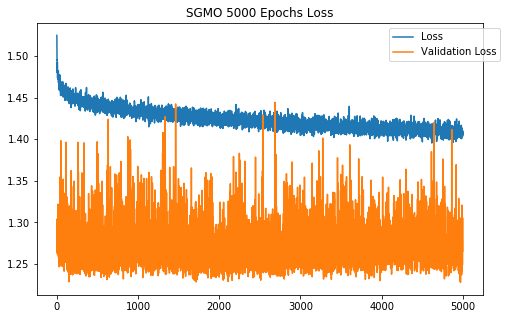

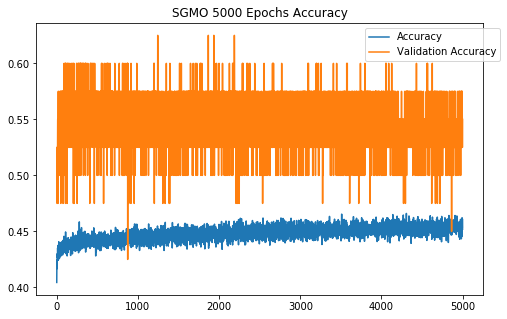

In [12]:
epochs = 5000

    

stock = 'SGMO'
(feature_train, label_train, feature_test, label_test) = (processed_data[stock]['data_1'],processed_data[stock]['target_1'], 
                                                                processed_data[stock]['data_test'],
                                                          processed_data[stock]['target_test']) 
model.fit(feature_train, label_train, batch_size=25, epochs=epochs, 
          validation_data = (feature_test, label_test), verbose=1)
dict_ = model.history.history
plt.figure(figsize=(8,5))
plt.title(f"{stock} {epochs} Epochs Loss")
plt.plot(dict_['loss'], label = 'Loss')
plt.plot(dict_['val_loss'], label= 'Validation Loss')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()
plt.figure(figsize=(8,5))
plt.title(f"{stock} {epochs} Epochs Accuracy")
plt.plot(dict_['acc'], label = 'Accuracy')
plt.plot(dict_['val_acc'], label= 'Validation Accuracy')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()
filepath = f"Model_GRU_cat_Low_1{stock}.h5"
    
model.save_weights(filepath)



In [13]:
from sklearn.metrics import label_ranking_average_precision_score, coverage_error, label_ranking_average_precision_score

In [15]:
list_= []
predict_list = []
true_list = []
for stock in stocks:
    X = np.array(processed_data[stock]['Data']).reshape(len(processed_data[stock]['Data']), 1, 8)
    predict = model.predict(X)
    for index, i in enumerate(predict):
        predict_list.append(i)
        true_list.append(processed_data[stock]['Target'][index])
    list_.append({'Ticker':stock, 'Ranking':label_ranking_average_precision_score(processed_data[stock]['Target'], predict)})
                  
df = pd.DataFrame(list_)
df.sort_values('Ranking', ascending=False).head(15)

,Ranking,Ticker
58,0.672649,SGMO
54,0.666236,ARNA
13,0.664698,AKBA
29,0.661676,ESPR
68,0.659777,PGNX
11,0.658859,IMGN
0,0.650718,ITCI
19,0.636235,MRNA
21,0.633482,FTSV
20,0.632950,CYTK


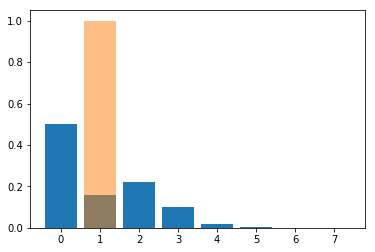

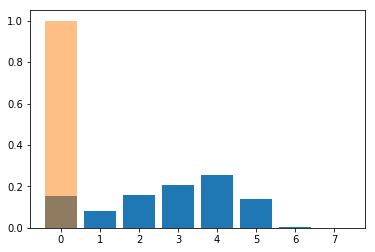

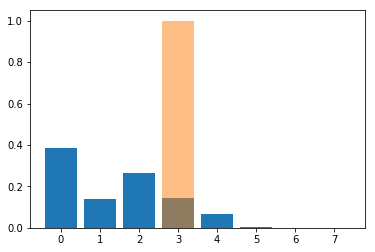

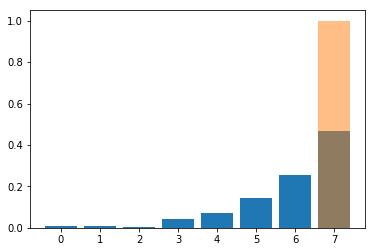

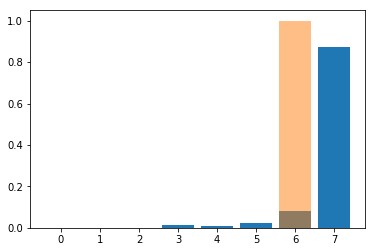

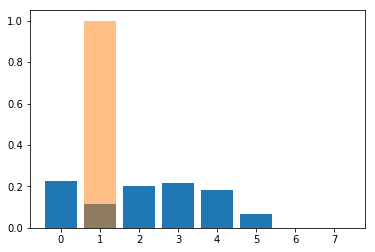

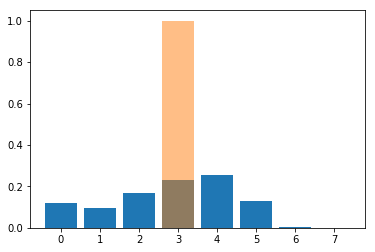

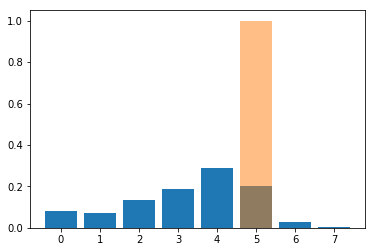

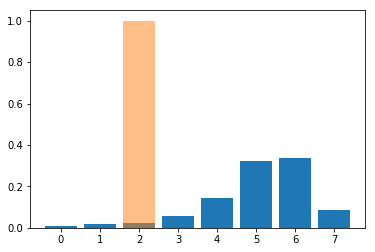

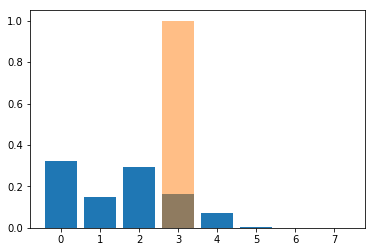

In [16]:
for i in range(0,10):
    plt.bar(list(range(0,8)),predict[i])
    plt.bar(list(range(0,8)),processed_data[stock]['Target'][i], alpha = 0.5)
    plt.show()

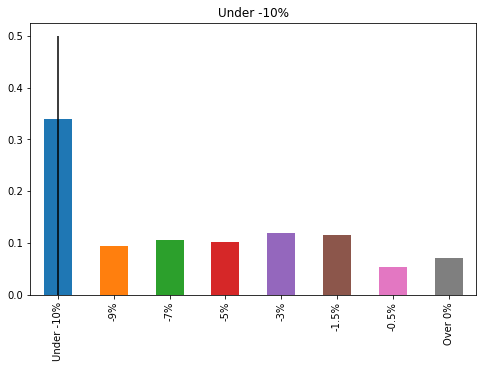

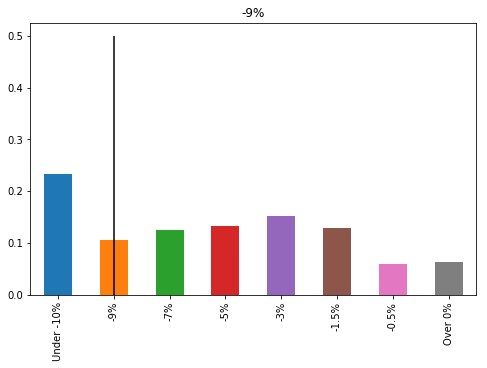

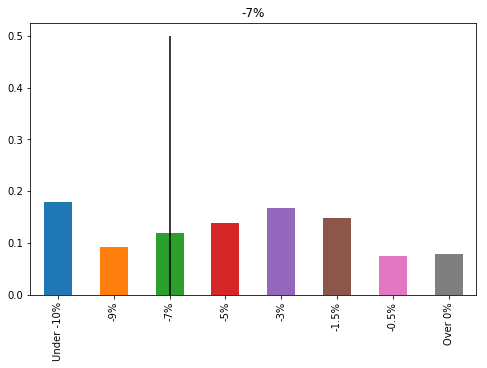

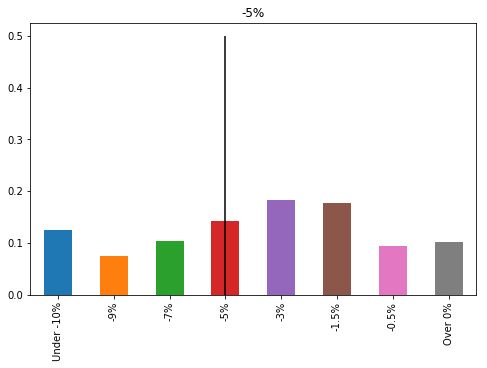

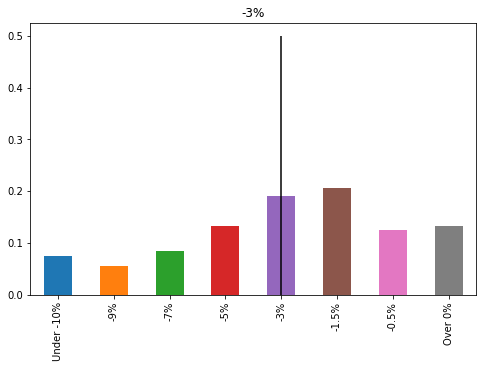

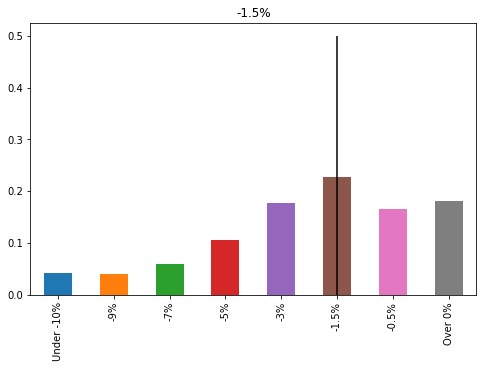

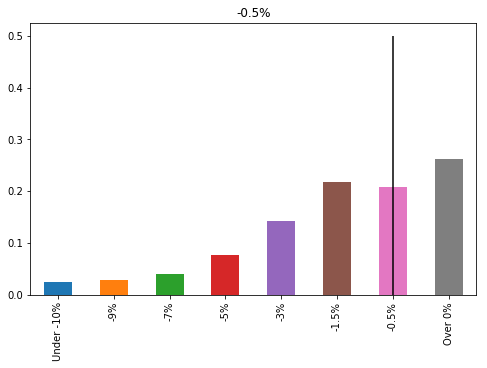

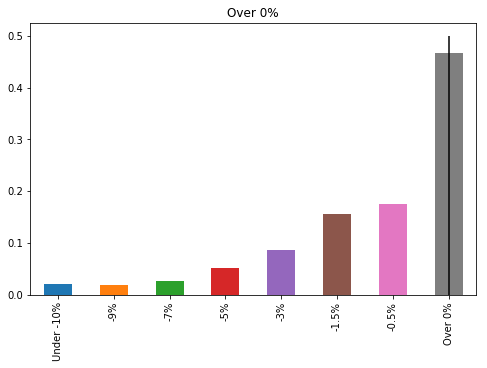

In [17]:
columns=['Under -10%', '-9%', '-7%', '-5%', '-3%', '-1.5%', '-0.5%', 'Over 0%']

for column, name in enumerate(columns):
    
    transfer_list = []
    for index, target in enumerate(true_list):
        if target[column] == 1:
            transfer_list.append(predict_list[index])
    plt.figure(figsize=(8,5))
    pd.DataFrame(transfer_list, columns=columns).mean().plot.bar().set_title(name)
    plt.vlines(column, 0,.5)
    plt.show

304
193
325
456
725
862
819
1269


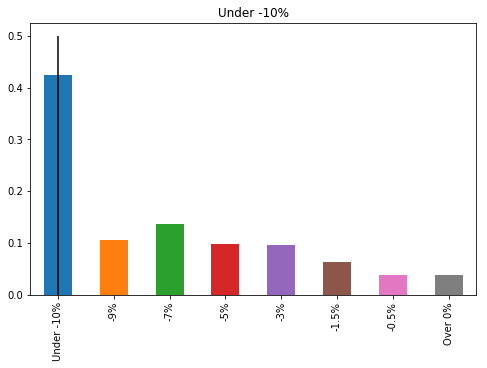

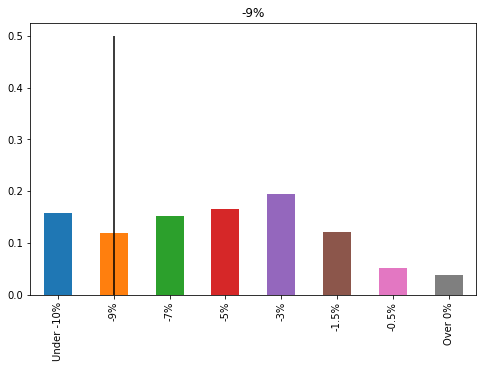

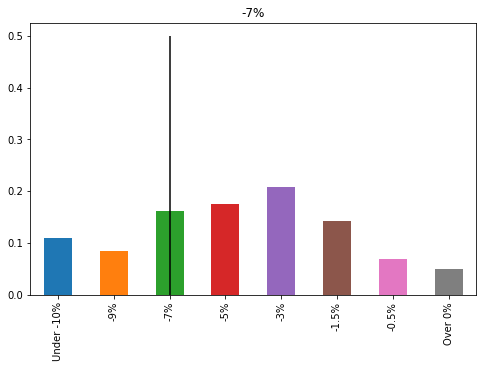

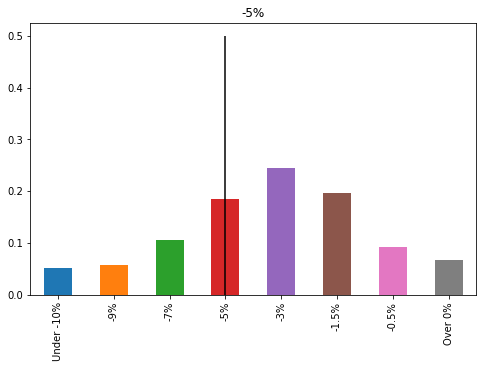

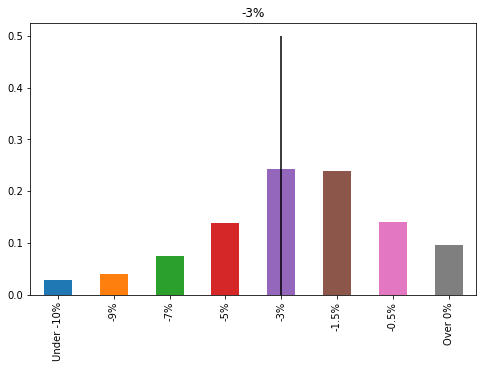

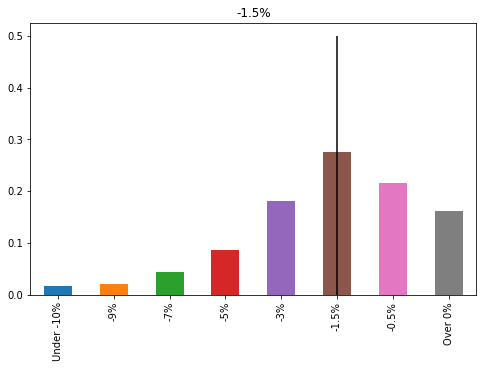

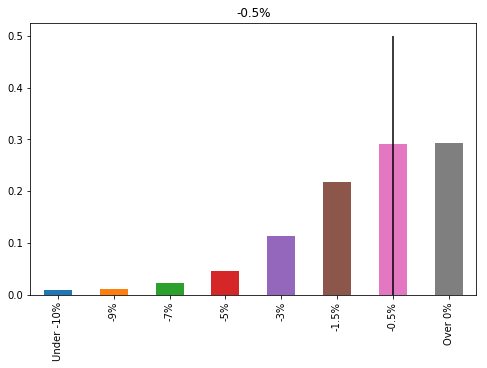

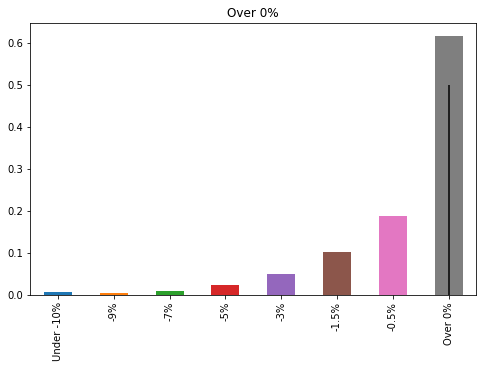

In [28]:

X = np.array(processed_data['SGMO']['Data']).reshape(len(processed_data['SGMO']['Data']), 1, 8)
predict = model.predict(X)

for column, name in enumerate(columns):
    transfer_list = []
    for index, target in enumerate(processed_data['SGMO']['Target']):
        if target[column] == 1:
            transfer_list.append(predict[index])
    plt.figure(figsize=(8,5))
    print(len(pd.DataFrame(transfer_list, columns=columns)))
    pd.DataFrame(transfer_list, columns=columns).mean().plot.bar().set_title(name)
    plt.vlines(column, 0,.5)
    plt.show   
                  


In [21]:
len(processed_data['SGMO']['Data'])

4953

In [26]:
processed_data['SGMO']['Data'][0]

array([0.19221411, 0.18588918, 0.18823529, 0.19647355, 0.19647355,
       0.0007544 , 0.21764746, 0.24224173])

In [27]:
target

array([0.14540146, 0.14783505, 0.14365325, 0.14629723, 0.14629723,
       0.08278175, 0.18053227, 0.1952524 ])